# Pi0 Hacking Notebook Part 8 — PyTorch Version

Same exploration as the JAX notebook, but using the PyTorch implementation for easier tracing.
The PyTorch model lets us hook into individual layers, set breakpoints, and inspect activations
without fighting `nn.scan` or the NNX bridge.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from datasets import load_dataset
from PIL import Image
import copy
import math
import time

import torch
import torch.nn.functional as F

# openpi imports
from openpi.training import config as _config
from openpi.policies import policy_config as _policy_config
from openpi.policies import aloha_policy
from openpi.shared import download
from openpi import transforms as _transforms
from openpi.shared import normalize as _normalize
from openpi.models import model as _model

print("Imports OK")

Imports OK


In [2]:
joint_labels = [
    "L joint 0 (waist)", "L joint 1 (shoulder)", "L joint 2 (elbow)",
    "L joint 3 (forearm)", "L joint 4 (wrist angle)", "L joint 5 (wrist rotate)",
    "L gripper",
    "R joint 0 (waist)", "R joint 1 (shoulder)", "R joint 2 (elbow)",
    "R joint 3 (forearm)", "R joint 4 (wrist angle)", "R joint 5 (wrist rotate)",
    "R gripper",
]

In [3]:
def frame_to_obs(frame):
    """Convert a HuggingFace dataset frame to the observation dict
    that the policy expects (post-RepackTransform format)."""
    def to_chw(img):
        arr = np.array(img)  # PIL -> HWC (H, W, 3)
        return arr.transpose(2, 0, 1)  # -> CHW (3, H, W)
    
    return {
        "images": {
            "cam_high": to_chw(frame["observation.images.cam_high"]),
            "cam_left_wrist": to_chw(frame["observation.images.cam_left_wrist"]),
            "cam_right_wrist": to_chw(frame["observation.images.cam_right_wrist"]),
        },
        "state": np.array(frame["observation.state"]),
        "prompt": "uncap the pen",
    }

## 1. Load Dataset

In [4]:
ds = load_dataset("physical-intelligence/aloha_pen_uncap_diverse", split="train")
print(f"Total rows: {len(ds)}")
print(f"Columns: {ds.column_names}")
print(f"Episode indices: {sorted(set(ds['episode_index']))}")

Resolving data files:   0%|          | 0/123 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/123 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/123 [00:00<?, ?it/s]

Total rows: 36900
Columns: ['observation.state', 'action', 'observation.velocity', 'observation.effort', 'observation.images.cam_high', 'observation.images.cam_low', 'observation.images.cam_left_wrist', 'observation.images.cam_right_wrist', 'timestamp', 'frame_index', 'episode_index', 'index', 'task_index']
Episode indices: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122]


In [5]:
# Pick an episode and grab all its frames
EPISODE_IDX = 0

ep_indices = np.array(ds["episode_index"])
mask = ep_indices == EPISODE_IDX
row_indices = np.where(mask)[0]
episode = ds.select(row_indices)

In [6]:
# Pick a frame in the middle of the episode
FRAME_IDX = 150
frame = episode[FRAME_IDX]

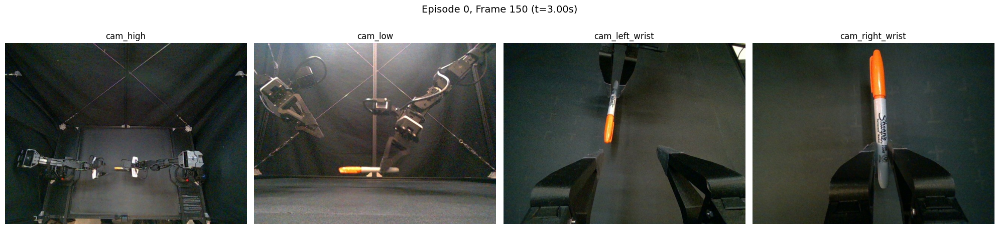

In [7]:
# Display camera views
cam_names = ["cam_high", "cam_low", "cam_left_wrist", "cam_right_wrist"]
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
for ax, name in zip(axes, cam_names):
    img = frame[f"observation.images.{name}"]
    ax.imshow(img)
    ax.set_title(name)
    ax.axis("off")
plt.suptitle(f"Episode {EPISODE_IDX}, Frame {FRAME_IDX} (t={frame['timestamp']:.2f}s)", fontsize=14)
plt.tight_layout()
plt.show()

## 2. Load PyTorch Model

In [8]:
config = _config.get_config("pi0_aloha_pen_uncap")

# Point to converted PyTorch checkpoint
checkpoint_dir = "/home/stephen/robots/openpi/pi0_aloha_pen_uncap_pytorch"

print(f"Model type: {config.model.model_type}")
print(f"Action dim: {config.model.action_dim}")
print(f"Action horizon: {config.model.action_horizon}")

Model type: ModelType.PI0
Action dim: 32
Action horizon: 50


In [9]:
# Create the trained policy — auto-detects PyTorch format
policy = _policy_config.create_trained_policy(config, checkpoint_dir)
print(f"Policy created successfully!")
print(f"PyTorch model: {policy._is_pytorch_model}")
print(f"Device: {policy._pytorch_device}")
print(f"Number of input transforms: {len(policy._input_transform.transforms)}")
print(f"Number of output transforms: {len(policy._output_transform.transforms)}")

Policy created successfully!
PyTorch model: True
Device: cuda
Number of input transforms: 8
Number of output transforms: 3


In [10]:
# Quick reference inference to make sure the model works
obs_test = frame_to_obs(frame)
result_test = policy.infer(obs_test)
print(f"Actions shape: {result_test['actions'].shape}")
print(f"Inference time: {result_test['policy_timing']['infer_ms']:.1f} ms")

Actions shape: (50, 14)
Inference time: 24589.0 ms


## 3. Reference Inference with Fixed Noise

Generate fixed noise (using numpy so we don't need JAX at all),
run `policy.infer` as a black box, and save the result as our reference.

In [11]:
# Fix noise for reproducibility (numpy, no JAX dependency)
rng = np.random.RandomState(42)
fixed_noise = rng.randn(50, 32).astype(np.float32)
print(f"fixed_noise: {fixed_noise.shape}, dtype={fixed_noise.dtype}")
print(f"  norm={np.linalg.norm(fixed_noise):.4f}, mean={fixed_noise.mean():.4f}")

# Reference result using policy.infer as a black box
obs_ref = frame_to_obs(frame)
result_ref = policy.infer(obs_ref, noise=fixed_noise)
print(f"\nReference actions: {result_ref['actions'].shape}")
print(f"  range: [{result_ref['actions'].min():.4f}, {result_ref['actions'].max():.4f}]")

fixed_noise: (50, 32), dtype=float32
  norm=39.7640, mean=0.0398

Reference actions: (50, 14)
  range: [-0.4732, 1.1150]


## 4. Manual Reproduction — Input Transforms

Replicate what `policy.infer()` does step by step.

In [12]:
device = torch.device(policy._pytorch_device)
pt_model = policy._model  # the PI0Pytorch instance
print(f"Device: {device}")
print(f"Model type: {type(pt_model).__name__}")

Device: cuda
Model type: PI0Pytorch


In [13]:
# Step 1: Input transforms (same chain as JAX version)
obs_manual = frame_to_obs(frame)
inputs = policy._input_transform(obs_manual)

print("After input transforms:")
for k, v in inputs.items():
    if isinstance(v, dict):
        for k2, v2 in v.items():
            print(f"  {k}/{k2}: {v2.shape}, dtype={v2.dtype}")
    elif isinstance(v, np.ndarray):
        print(f"  {k}: {v.shape}, dtype={v.dtype}")
    else:
        print(f"  {k}: {type(v)}")

After input transforms:
  image/base_0_rgb: (224, 224, 3), dtype=uint8
  image/left_wrist_0_rgb: (224, 224, 3), dtype=uint8
  image/right_wrist_0_rgb: (224, 224, 3), dtype=uint8
  image_mask/base_0_rgb: (), dtype=bool
  image_mask/left_wrist_0_rgb: (), dtype=bool
  image_mask/right_wrist_0_rgb: (), dtype=bool
  state: (32,), dtype=float64
  tokenized_prompt: (48,), dtype=int64
  tokenized_prompt_mask: (48,), dtype=bool


In [14]:
# Step 2: Batch and convert to PyTorch tensors — each leaf [shape] -> torch [1, shape]
import jax  # just for tree.map utility, no JAX computation
inputs_pt = jax.tree.map(
    lambda x: torch.from_numpy(np.array(x)).to(device)[None, ...],
    inputs
)

print("Batched PyTorch tensors:")
for k, v in inputs_pt.items():
    if isinstance(v, dict):
        for k2, v2 in v.items():
            print(f"  {k}/{k2}: {v2.shape}, dtype={v2.dtype}, device={v2.device}")
    elif isinstance(v, torch.Tensor):
        print(f"  {k}: {v.shape}, dtype={v.dtype}")

Batched PyTorch tensors:
  image/base_0_rgb: torch.Size([1, 224, 224, 3]), dtype=torch.uint8, device=cuda:0
  image/left_wrist_0_rgb: torch.Size([1, 224, 224, 3]), dtype=torch.uint8, device=cuda:0
  image/right_wrist_0_rgb: torch.Size([1, 224, 224, 3]), dtype=torch.uint8, device=cuda:0
  image_mask/base_0_rgb: torch.Size([1]), dtype=torch.bool, device=cuda:0
  image_mask/left_wrist_0_rgb: torch.Size([1]), dtype=torch.bool, device=cuda:0
  image_mask/right_wrist_0_rgb: torch.Size([1]), dtype=torch.bool, device=cuda:0
  state: torch.Size([1, 32]), dtype=torch.float64
  tokenized_prompt: torch.Size([1, 48]), dtype=torch.int64
  tokenized_prompt_mask: torch.Size([1, 48]), dtype=torch.bool


In [15]:
# Step 3: Build Observation dataclass
# For torch uint8 images, from_dict converts to float32 and permutes to BCHW
observation = _model.Observation.from_dict(inputs_pt)

print("Observation:")
for name, img in observation.images.items():
    print(f"  image[{name}]: {img.shape}, dtype={img.dtype}, range=[{img.min():.2f}, {img.max():.2f}]")
for name, m in observation.image_masks.items():
    print(f"  mask[{name}]: {m.shape}, dtype={m.dtype}")
print(f"  state: {observation.state.shape}, dtype={observation.state.dtype}")
print(f"  tokenized_prompt: {observation.tokenized_prompt.shape}")
print(f"  tokenized_prompt_mask: {observation.tokenized_prompt_mask.shape}, valid={observation.tokenized_prompt_mask.sum()}")

Observation:
  image[base_0_rgb]: torch.Size([1, 3, 224, 224]), dtype=torch.float32, range=[-1.00, 0.99]
  image[left_wrist_0_rgb]: torch.Size([1, 3, 224, 224]), dtype=torch.float32, range=[-1.00, 1.00]
  image[right_wrist_0_rgb]: torch.Size([1, 3, 224, 224]), dtype=torch.float32, range=[-1.00, 1.00]
  mask[base_0_rgb]: torch.Size([1]), dtype=torch.bool
  mask[left_wrist_0_rgb]: torch.Size([1]), dtype=torch.bool
  mask[right_wrist_0_rgb]: torch.Size([1]), dtype=torch.bool
  state: torch.Size([1, 32]), dtype=torch.float64
  tokenized_prompt: torch.Size([1, 48])
  tokenized_prompt_mask: torch.Size([1, 48]), valid=6


## 5. Preprocess + Embed Prefix

Now we enter the model internals. The PyTorch model's `_preprocess_observation`
handles image resizing, then `embed_prefix` runs SigLIP on images and embeds language tokens.

In [16]:
# Step 4: Preprocess observation (no augmentation at inference)
# This unpacks the Observation into lists that embed_prefix expects
images, img_masks, lang_tokens, lang_masks, state = pt_model._preprocess_observation(
    observation, train=False
)

print("Preprocessed observation:")
for i, (img, mask) in enumerate(zip(images, img_masks)):
    print(f"  image[{i}]: {img.shape}, dtype={img.dtype}, range=[{img.min():.2f}, {img.max():.2f}]")
    print(f"  mask[{i}]:  {mask.shape}, val={mask}")
print(f"  lang_tokens: {lang_tokens.shape}, dtype={lang_tokens.dtype}")
print(f"  lang_masks: {lang_masks.shape}, valid={lang_masks.sum()}")
print(f"  state: {state.shape}, dtype={state.dtype}")

Preprocessed observation:
  image[0]: torch.Size([1, 3, 224, 224]), dtype=torch.float32, range=[-1.00, 0.99]
  mask[0]:  torch.Size([1]), val=tensor([True], device='cuda:0')
  image[1]: torch.Size([1, 3, 224, 224]), dtype=torch.float32, range=[-1.00, 1.00]
  mask[1]:  torch.Size([1]), val=tensor([True], device='cuda:0')
  image[2]: torch.Size([1, 3, 224, 224]), dtype=torch.float32, range=[-1.00, 1.00]
  mask[2]:  torch.Size([1]), val=tensor([True], device='cuda:0')
  lang_tokens: torch.Size([1, 48]), dtype=torch.int64
  lang_masks: torch.Size([1, 48]), valid=6
  state: torch.Size([1, 32]), dtype=torch.float64


In [17]:
# Step 5: Embed prefix using model's embed_prefix method
with torch.no_grad():
    prefix_embs, prefix_pad_masks, prefix_att_masks = pt_model.embed_prefix(
        images, img_masks, lang_tokens, lang_masks
    )

print(f"prefix_embs:      {prefix_embs.shape}, dtype={prefix_embs.dtype}")      # [1, 816, 2048]
print(f"prefix_pad_masks: {prefix_pad_masks.shape}, dtype={prefix_pad_masks.dtype}")  # [1, 816]
print(f"prefix_att_masks: {prefix_att_masks.shape}, dtype={prefix_att_masks.dtype}")  # [1, 816]

prefix_embs:      torch.Size([1, 816, 2048]), dtype=torch.bfloat16
prefix_pad_masks: torch.Size([1, 816]), dtype=torch.bool
prefix_att_masks: torch.Size([1, 816]), dtype=torch.bool


### 5b. Expand embed_prefix manually

Let's do what `embed_prefix` does, but step by step so we can inspect each piece.
This is much easier to trace than the JAX version!

In [18]:
with torch.no_grad():
    embs_list = []
    pad_mask_list = []
    ar_mask_list = []

    # --- Encode each image through SigLIP ---
    # In PyTorch: paligemma.model.get_image_features
    # This is HuggingFace's PaliGemma vision tower (SigLIP So400m/14)
    for i, (img, img_mask) in enumerate(zip(images, img_masks)):
        img_emb = pt_model.paligemma_with_expert.embed_image(img)
        bsize, num_img_tokens = img_emb.shape[:2]

        print(f"SigLIP image {i}:")
        print(f"  input:  {img.shape}, dtype={img.dtype}, range=[{img.min():.2f}, {img.max():.2f}]")
        print(f"  output: {img_emb.shape}, dtype={img_emb.dtype}")

        embs_list.append(img_emb)
        pad_mask_list.append(img_mask[:, None].expand(bsize, num_img_tokens))
        ar_mask_list += [0] * num_img_tokens

    # --- Embed language tokens ---
    # PaliGemma's embedding table + scale by sqrt(dim)
    lang_emb = pt_model.paligemma_with_expert.embed_language_tokens(lang_tokens)
    lang_emb_dim = lang_emb.shape[-1]
    lang_emb = lang_emb * math.sqrt(lang_emb_dim)

    print(f"\nLanguage embedding:")
    print(f"  token IDs: {lang_tokens.shape}, non-padding: {lang_masks.sum()}")
    print(f"  embeddings: {lang_emb.shape}, dtype={lang_emb.dtype}")

    embs_list.append(lang_emb)
    pad_mask_list.append(lang_masks)
    ar_mask_list += [0] * lang_emb.shape[1]

    # --- Concatenate into full prefix sequence ---
    prefix_embs_manual = torch.cat(embs_list, dim=1)
    prefix_pad_masks_manual = torch.cat(pad_mask_list, dim=1)

    print(f"\nFull prefix:")
    print(f"  embs:      {prefix_embs_manual.shape}  (3x256 image + 48 language = 816)")
    print(f"  pad_masks: {prefix_pad_masks_manual.shape}  (valid: {prefix_pad_masks_manual.sum()})")

    # --- Compare against reference ---
    max_diff = (prefix_embs_manual - prefix_embs).abs().max().item()
    print(f"\nMax diff vs embed_prefix reference: {max_diff}")

SigLIP image 0:
  input:  torch.Size([1, 3, 224, 224]), dtype=torch.float32, range=[-1.00, 0.99]
  output: torch.Size([1, 256, 2048]), dtype=torch.bfloat16
SigLIP image 1:
  input:  torch.Size([1, 3, 224, 224]), dtype=torch.float32, range=[-1.00, 1.00]
  output: torch.Size([1, 256, 2048]), dtype=torch.bfloat16
SigLIP image 2:
  input:  torch.Size([1, 3, 224, 224]), dtype=torch.float32, range=[-1.00, 1.00]
  output: torch.Size([1, 256, 2048]), dtype=torch.bfloat16

Language embedding:
  token IDs: torch.Size([1, 48]), non-padding: 6
  embeddings: torch.Size([1, 48, 2048]), dtype=torch.bfloat16

Full prefix:
  embs:      torch.Size([1, 816, 2048])  (3x256 image + 48 language = 816)
  pad_masks: torch.Size([1, 816])  (valid: 774)

Max diff vs embed_prefix reference: 0.0


In [19]:
# pt_model.paligemma_with_expert.embed_image?
# pt_model.paligemma_with_expert.model.get_image_features

In [20]:
# pt_model.paligemma_with_expert.paligemma.model.get_image_features

In [21]:
lang_tokens

tensor([[   2,  549, 5549,  573, 3008,  108,    0,    0,    0,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0]],
       device='cuda:0')

In [22]:
# from transformers import AutoTokenizer

# tokenizer = AutoTokenizer.from_pretrained("google/paligemma-3b-pt-224")

# # Decode the full sequence
# print(tokenizer.decode(lang_tokens[0]))

# # See individual tokens (including padding)
# tokens = tokenizer.convert_ids_to_tokens(lang_tokens[0].tolist())
# for i, (tok, mask) in enumerate(zip(tokens, lang_masks[0])):
#     print(f"  [{i:2d}] id={lang_tokens[0, i]:6d}  mask={mask.item()}  '{tok}'")

## 6. Prefix Forward Pass → KV Cache

Run the prefix tokens through the PaliGemma language model (18 layers) and cache the K, V.
This is the `[prefix_embs, None]` call — only expert 0 (PaliGemma) runs.

In [23]:
from openpi.models_pytorch.pi0_pytorch import make_att_2d_masks

with torch.no_grad():
    # Build attention mask
    prefix_att_2d = make_att_2d_masks(prefix_pad_masks, prefix_att_masks)
    prefix_positions = torch.cumsum(prefix_pad_masks, dim=1) - 1

    print(f"prefix_att_2d: {prefix_att_2d.shape}")  # [1, 816, 816]
    print(f"prefix_positions: {prefix_positions.shape}")  # [1, 816]

    # Convert to 4D attention mask (the format HuggingFace expects)
    prefix_att_4d = pt_model._prepare_attention_masks_4d(prefix_att_2d)
    print(f"prefix_att_4d: {prefix_att_4d.shape}")  # [1, 1, 816, 816]

    # Set eager attention (not SDPA) so we can hook into it
    pt_model.paligemma_with_expert.paligemma.language_model.config._attn_implementation = "eager"

    # Forward pass: [prefix_embs, None] — only PaliGemma runs, action expert gets None
    _, kv_cache = pt_model.paligemma_with_expert.forward(
        attention_mask=prefix_att_4d,
        position_ids=prefix_positions,
        past_key_values=None,
        inputs_embeds=[prefix_embs, None],
        use_cache=True,
    )

print(f"\nKV cache type: {type(kv_cache).__name__}")
print(f"KV cache layers: {len(kv_cache)}")
# Each layer has (key, value) tensors
k0, v0 = kv_cache[0]
print(f"Layer 0 K: {k0.shape}, V: {v0.shape}")  # [1, num_kv_heads, 816, head_dim]

prefix_att_2d: torch.Size([1, 816, 816])
prefix_positions: torch.Size([1, 816])
prefix_att_4d: torch.Size([1, 1, 816, 816])

KV cache type: DynamicCache
KV cache layers: 18
Layer 0 K: torch.Size([1, 1, 816, 256]), V: torch.Size([1, 1, 816, 256])


In [24]:
prefix_att_4d.shape

torch.Size([1, 1, 816, 816])

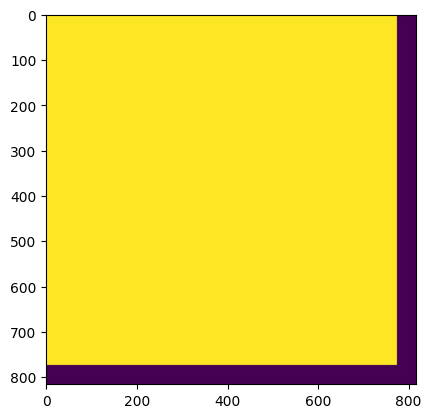

In [25]:
plt.imshow(prefix_att_4d[0,0].detach().cpu().numpy())

- Right so not the diagonal attention mask we would see in autoregressive text generation
- Hmm i would like to visualize some attention patterns!

In [26]:
pt_model.paligemma_with_expert

PaliGemmaWithExpertModel(
  (paligemma): PaliGemmaForConditionalGeneration(
    (model): PaliGemmaModel(
      (vision_tower): SiglipVisionModel(
        (vision_model): SiglipVisionTransformer(
          (embeddings): SiglipVisionEmbeddings(
            (patch_embedding): Conv2d(3, 1152, kernel_size=(14, 14), stride=(14, 14), padding=valid)
            (position_embedding): Embedding(256, 1152)
          )
          (encoder): SiglipEncoder(
            (layers): ModuleList(
              (0-26): 27 x SiglipEncoderLayer(
                (layer_norm1): LayerNorm((1152,), eps=1e-06, elementwise_affine=True)
                (self_attn): SiglipAttention(
                  (k_proj): Linear(in_features=1152, out_features=1152, bias=True)
                  (v_proj): Linear(in_features=1152, out_features=1152, bias=True)
                  (q_proj): Linear(in_features=1152, out_features=1152, bias=True)
                  (out_proj): Linear(in_features=1152, out_features=1152, bias=True)
      

In [27]:
# pt_model.paligemma_with_expert?

In [28]:
state.shape

torch.Size([1, 32])

In [29]:
state

tensor([[-0.2073, -0.0050, -0.8066, -0.6117, -1.2639,  0.4968,  0.7046, -0.1185,
         -0.7430, -0.0498,  0.0678, -0.8378, -0.4027, -1.2744,  0.0000,  0.0000,
          0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000]],
       device='cuda:0', dtype=torch.float64)

In [30]:
# x_t.shape

In [31]:
# x_t

## 7. Flow Matching Denoising Loop

10 Euler steps from t=1 (noise) to t=0 (actions).
Each step embeds the suffix (state + noisy actions + timestep), runs the action expert
with the cached prefix KV, and takes an Euler step.

- man you could visualize this process as a 32x50 image, and the pull out different projections/plots - that would be kinda interesting!

In [32]:
num_steps = 10
dt = -1.0 / num_steps

# Start from fixed noise
noise_pt = torch.from_numpy(fixed_noise).to(device)[None, ...]  # [1, 50, 32]
x_t = noise_pt.clone()

# Collect trajectory for visualization
trajectory = [x_t[0].cpu().numpy().copy()]
velocities = []
t = 1.0

with torch.no_grad():
    for step in range(num_steps):
        timestep = torch.tensor([t], dtype=torch.float32, device=device)

        # === Embed suffix: state token + action/time tokens ===
        suffix_embs, suffix_pad_masks, suffix_att_masks, adarms_cond = pt_model.embed_suffix(
            state, x_t, timestep
        )
        if step == 0:
            print(f"suffix_embs: {suffix_embs.shape}")       # [1, 51, 1024] = 1 state + 50 action
            print(f"suffix_pad_masks: {suffix_pad_masks.shape}")
            print(f"suffix_att_masks: {suffix_att_masks.shape}")
            print(f"adarms_cond: {adarms_cond}")              # None for pi0

        # === Build attention mask ===
        # suffix queries attend to [prefix KV cache | suffix tokens]
        suffix_len = suffix_pad_masks.shape[1]
        batch_size = prefix_pad_masks.shape[0]
        prefix_len = prefix_pad_masks.shape[1]

        prefix_cross_mask = prefix_pad_masks[:, None, :].expand(batch_size, suffix_len, prefix_len)
        suffix_att_2d = make_att_2d_masks(suffix_pad_masks, suffix_att_masks)
        full_att_2d = torch.cat([prefix_cross_mask, suffix_att_2d], dim=2)

        if step == 0:
            print(f"full_att_2d: {full_att_2d.shape}")  # [1, 51, 816+51]

        # Suffix positions continue from where prefix left off
        prefix_offsets = torch.sum(prefix_pad_masks, dim=-1)[:, None]
        suffix_positions = prefix_offsets + torch.cumsum(suffix_pad_masks, dim=1) - 1

        # Convert to 4D mask
        full_att_4d = pt_model._prepare_attention_masks_4d(full_att_2d)

        # Set eager attention for action expert too
        pt_model.paligemma_with_expert.gemma_expert.model.config._attn_implementation = "eager"

        # === Forward pass: [None, suffix_embs] — action expert runs, PaliGemma skipped ===
        (prefix_out, suffix_out), _ = pt_model.paligemma_with_expert.forward(
            attention_mask=full_att_4d,
            position_ids=suffix_positions,
            past_key_values=kv_cache,
            inputs_embeds=[None, suffix_embs],
            use_cache=False,
            adarms_cond=[None, adarms_cond],
        )
        assert prefix_out is None

        # Extract velocity from last 50 tokens (action tokens, excluding state token)
        action_out = suffix_out[:, -pt_model.config.action_horizon:]
        v_t = pt_model.action_out_proj(action_out.to(torch.float32))

        if step == 0:
            print(f"\nv_t (velocity): {v_t.shape}")  # [1, 50, 32]

        # Euler step
        x_t = x_t + dt * v_t
        t = t + dt

        trajectory.append(x_t[0].cpu().numpy().copy())
        velocities.append(v_t[0].cpu().numpy().copy())
        print(f"  step {step}: t={t-dt:.1f}->{t:.1f}, |v_t|={v_t.norm():.2f}, |x_t|={x_t.norm():.2f}")

suffix_embs: torch.Size([1, 51, 1024])
suffix_pad_masks: torch.Size([1, 51])
suffix_att_masks: torch.Size([1, 51])
adarms_cond: None
full_att_2d: torch.Size([1, 51, 867])

v_t (velocity): torch.Size([1, 50, 32])
  step 0: t=1.0->0.9, |v_t|=41.55, |x_t|=35.79
  step 1: t=0.9->0.8, |v_t|=41.40, |x_t|=31.88
  step 2: t=0.8->0.7, |v_t|=41.42, |x_t|=28.03
  step 3: t=0.7->0.6, |v_t|=41.40, |x_t|=24.29
  step 4: t=0.6->0.5, |v_t|=41.37, |x_t|=20.69
  step 5: t=0.5->0.4, |v_t|=41.40, |x_t|=17.33
  step 6: t=0.4->0.3, |v_t|=41.35, |x_t|=14.39
  step 7: t=0.3->0.2, |v_t|=41.32, |x_t|=12.16
  step 8: t=0.2->0.1, |v_t|=41.22, |x_t|=11.09
  step 9: t=0.1->0.0, |v_t|=41.24, |x_t|=11.50


In [33]:
trajectory[0].shape

(50, 32)

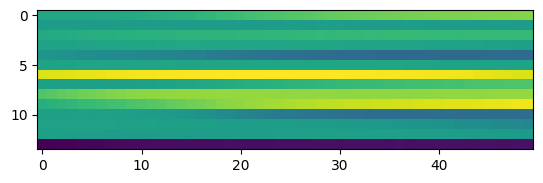

In [34]:
plt.imshow(trajectory[-1][:,:14].T)

In [38]:
import os, matplotlib

In [39]:
save_dir='/home/stephen/robots/p51b'
os.makedirs(save_dir, exist_ok=True)

# for i in range(len(trajectory)):
#     matplotlib.image.imsave(save_dir + '/'+ str(i).zfill(2) +'.png', trajectory[i][:,:14].T, cmap="viridis", dpi=200)

scale = 20
for i in range(len(trajectory)):
    img = trajectory[i][:, :14].T
    img_upscaled = np.repeat(np.repeat(img, scale, axis=0), scale, axis=1)
    matplotlib.image.imsave(
        save_dir + '/' + str(i).zfill(2) + '.png',
        img_upscaled,
        cmap="viridis"
    )

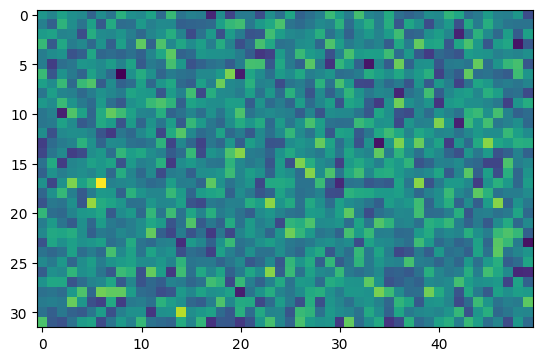

In [34]:
plt.imshow(trajectory[0].T)

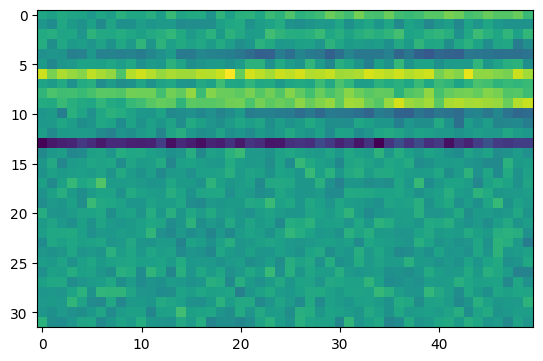

In [35]:
plt.imshow(trajectory[-2].T)

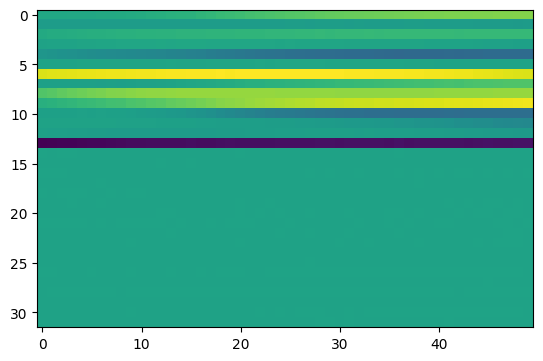

In [36]:
plt.imshow(trajectory[-1].T)

In [38]:
save_dir='/home/stephen/robots/p51'

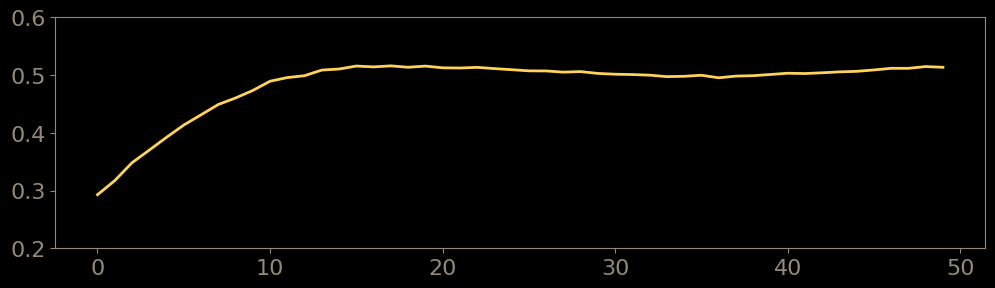

In [39]:
CHILL_BROWN = '#948979'

fig=plt.figure(0, (12, 3), facecolor='k')
ax=fig.add_subplot(111, facecolor='k')
plt.plot(trajectory[-1][:,8], c='#FFD35A', linewidth=2)

ax.tick_params(colors=CHILL_BROWN, labelsize=16)
for spine in ax.spines.values():
    spine.set_edgecolor(CHILL_BROWN)
ax.xaxis.label.set_color(CHILL_BROWN)
ax.yaxis.label.set_color(CHILL_BROWN)
plt.ylim(0.2, 0.6)

plt.savefig(save_dir+'/shoulder_timeseries_2.png', dpi=250)

In [40]:
# np.save(save_dir + '/all_trajectories', all_trajectories)

NameError: name 'all_trajectories' is not defined

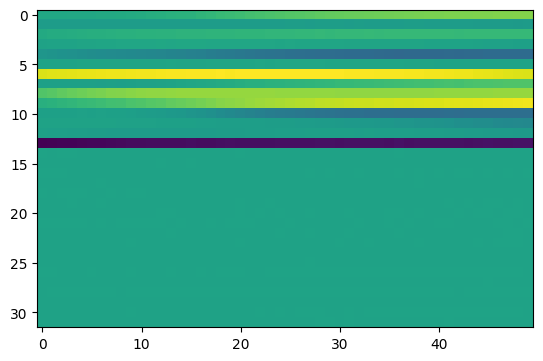

In [61]:
plt.imshow(trajectory[-1].T)

- Ok that's kinda fun! I like the connection to images!
- Ok so thinking more about the velocity field here - each 50*32=1600 dimensions will have an associtated 1d velocity field.
- I'm free to pick any two dimensions (pixels in above image) I want and can do a little velocity field thing
- What's weird though is each (wall) time steps is an indpenent dimension here!
- I still kinda feel like some version of what I'm thinking might be feasible though?
- So we can certainly follow the journey of 50 points (each with a different wall time), really just two rows of our image, right?
- haha could overlay all 50 velocity fields at once in corresponding Viridis colors -> that would be insane.

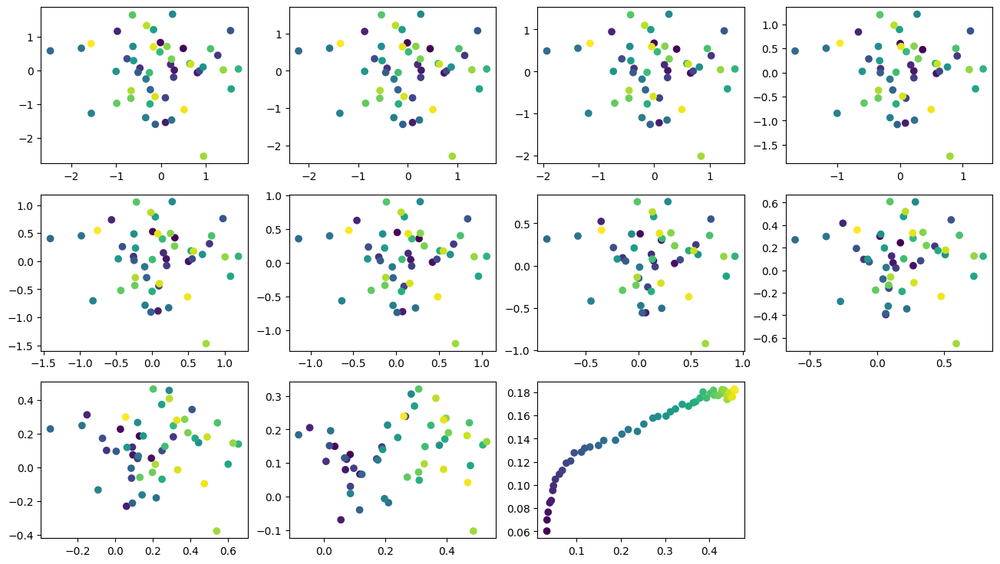

In [69]:
fig=plt.figure(0, (16,9))
for i in range(len(trajectory)):
    ax=fig.add_subplot(3,4,i+1)
    ax.scatter(trajectory[i][:,0], trajectory[i][:,2], c=np.arange(50), linestyle='-')

- Man so Chaotic until the end!
- Wonder how hard ti would be to adjust diffusion timesteps?

```
Ok let's try something WEIRD. I kinda like the view below (last few lines), where the axes of our plot are two encoder positions, and we use color for wall time. So we get 50 points that start random then form a nice trajectory. If I understand correctly -> each of our 50 points in this visualization would have it's own velocity field in this space. Let's compute all 50 on a -1 to 1 grid of say 25 points, and through all 10 diffusion timesteps. Then I'd like to add to my plotting code below the option to include between 1 and 50 of these vector fields on the plots, in a matching color to each point (viridis colormap, corresponding to wall time)
```

In [70]:
# === Compute velocity fields for all 50 action steps ===

from transformers.cache_utils import DynamicCache

DIM_X, DIM_Y = 0, 2
GRID_N = 12  # 12x12 = 144 grid points. Increase for smoother arrows, decrease if slow
GRID_RANGE = (-1.5, 1.5)  # normalized action space

xs = np.linspace(*GRID_RANGE, GRID_N)
ys = np.linspace(*GRID_RANGE, GRID_N)
grid_x, grid_y = np.meshgrid(xs, ys)
grid_flat_x = torch.tensor(grid_x.flatten(), dtype=torch.float32, device=device)
grid_flat_y = torch.tensor(grid_y.flatten(), dtype=torch.float32, device=device)
n_grid = GRID_N * GRID_N

def expand_kv_cache(kv_cache, batch_size):
    """Expand KV cache to a new batch size (uses views, no memory copy)."""
    expanded = DynamicCache()
    for layer_idx in range(len(kv_cache)):
        k, v = kv_cache[layer_idx]
        expanded.update(
            k.expand(batch_size, -1, -1, -1),
            v.expand(batch_size, -1, -1, -1),
            layer_idx,
        )
    return expanded

# Storage: velocity_fields[diff_step] = array of shape [50, GRID_N, GRID_N, 2]
velocity_fields = {}
ACTION_HORIZON = 50
BATCH_SIZE = ACTION_HORIZON  # one batch element per action step

print(f"Grid: {GRID_N}x{GRID_N} = {n_grid} points")
print(f"Total forward passes: {n_grid} grid points x 10 diff steps = {n_grid * 10}")
print(f"Each pass: batch={BATCH_SIZE} (one per action step)")
print()

t0 = time.time()

with torch.no_grad():
    for diff_step in range(num_steps):
        t_val = 1.0 - diff_step * 0.1
        base_x_t = torch.tensor(
            trajectory[diff_step], dtype=torch.float32, device=device
        )  # [50, 32]

        step_fields = np.zeros((ACTION_HORIZON, GRID_N, GRID_N, 2))

        for gi in range(n_grid):
            # Build batch: 50 copies of base_x_t
            # Element k has position k's dims modified to the grid point
            batch_x_t = base_x_t[None].expand(BATCH_SIZE, -1, -1).clone()  # [50, 50, 32]
            batch_x_t[torch.arange(BATCH_SIZE), torch.arange(BATCH_SIZE), DIM_X] = grid_flat_x[gi]
            batch_x_t[torch.arange(BATCH_SIZE), torch.arange(BATCH_SIZE), DIM_Y] = grid_flat_y[gi]

            state_b = state.expand(BATCH_SIZE, -1)
            prefix_pad_b = prefix_pad_masks.expand(BATCH_SIZE, -1)
            cache_b = expand_kv_cache(kv_cache, BATCH_SIZE)
            timestep_b = torch.full((BATCH_SIZE,), t_val, dtype=torch.float32, device=device)

            v_out = pt_model.denoise_step(state_b, prefix_pad_b, cache_b, batch_x_t, timestep_b)
            # v_out: [50, 50, 32]

            # For element k, extract velocity at position k
            row, col = gi // GRID_N, gi % GRID_N
            step_fields[:, row, col, 0] = v_out[torch.arange(BATCH_SIZE), torch.arange(BATCH_SIZE), DIM_X].cpu().numpy()
            step_fields[:, row, col, 1] = v_out[torch.arange(BATCH_SIZE), torch.arange(BATCH_SIZE), DIM_Y].cpu().numpy()

        velocity_fields[diff_step] = step_fields
        elapsed = time.time() - t0
        rate = (diff_step + 1) * n_grid / elapsed
        eta = (num_steps - diff_step - 1) * n_grid / rate
        print(f"  diff step {diff_step} (t={t_val:.1f}): done  [{elapsed:.0f}s elapsed, ~{eta:.0f}s remaining]")

print(f"\nDone! Total time: {time.time() - t0:.0f}s")
print(f"velocity_fields shape per step: {velocity_fields[0].shape}")  # [50, 12, 12, 2]

Grid: 12x12 = 144 points
Total forward passes: 144 grid points x 10 diff steps = 1440
Each pass: batch=50 (one per action step)

  diff step 0 (t=1.0): done  [13s elapsed, ~113s remaining]
  diff step 1 (t=0.9): done  [25s elapsed, ~100s remaining]
  diff step 2 (t=0.8): done  [38s elapsed, ~88s remaining]
  diff step 3 (t=0.7): done  [50s elapsed, ~76s remaining]
  diff step 4 (t=0.6): done  [63s elapsed, ~63s remaining]
  diff step 5 (t=0.5): done  [76s elapsed, ~50s remaining]
  diff step 6 (t=0.4): done  [88s elapsed, ~38s remaining]
  diff step 7 (t=0.3): done  [101s elapsed, ~25s remaining]
  diff step 8 (t=0.2): done  [114s elapsed, ~13s remaining]
  diff step 9 (t=0.1): done  [127s elapsed, ~0s remaining]

Done! Total time: 127s
velocity_fields shape per step: (50, 12, 12, 2)


In [71]:
def plot_flow_with_fields(trajectory, velocity_fields, grid_x, grid_y,
                          action_steps_to_show=None, arrow_alpha=0.4,
                          arrow_scale=None):
    """
    Plot flow matching process with velocity field overlays.
    
    action_steps_to_show: list of action step indices (0-49) to show velocity fields for.
                          Each gets arrows colored to match its viridis scatter color.
                          None = no arrows, [] = no arrows, [0, 25, 49] = show 3 fields, etc.
    """
    n_snapshots = len(trajectory)
    n_cols = 4
    n_rows = (n_snapshots + n_cols - 1) // n_cols
    
    cmap = plt.cm.viridis
    point_colors = cmap(np.linspace(0, 1, 50))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
    axes = axes.flatten()
    
    for plot_idx in range(n_snapshots):
        ax = axes[plot_idx]
        snap = trajectory[plot_idx]
        t_val = 1.0 - plot_idx * 0.1
        
        # Velocity field arrows (behind scatter points)
        if action_steps_to_show and plot_idx in velocity_fields:
            vf = velocity_fields[plot_idx]  # [50, GRID_N, GRID_N, 2]
            for k in action_steps_to_show:
                color = point_colors[k]
                speed = np.sqrt(vf[k, :, :, 0]**2 + vf[k, :, :, 1]**2)
                # Normalize arrows so they're all readable
                if arrow_scale is None:
                    # Auto-scale: make longest arrow ~1 grid cell
                    grid_spacing = (GRID_RANGE[1] - GRID_RANGE[0]) / GRID_N
                    max_speed = speed.max() + 1e-8
                    scale_factor = max_speed / grid_spacing * 2
                else:
                    scale_factor = arrow_scale
                    
                ax.quiver(grid_x, grid_y, vf[k, :, :, 0], vf[k, :, :, 1],
                          color=color, alpha=arrow_alpha, scale=scale_factor,
                          scale_units='xy', width=0.004, headwidth=4, zorder=2)
        
        # Scatter all 50 points (on top of arrows)
        ax.scatter(snap[:, DIM_X], snap[:, DIM_Y], 
                   c=np.arange(50), cmap='viridis', s=40, 
                   zorder=5, edgecolors='k', linewidths=0.5)
        
        # Connect points with a faint line to show trajectory shape
        ax.plot(snap[:, DIM_X], snap[:, DIM_Y], 
                'k-', alpha=0.15, linewidth=0.5, zorder=3)
        
        ax.set_title(f"t = {t_val:.1f}", fontsize=12)
        ax.set_xlim(*GRID_RANGE)
        ax.set_ylim(*GRID_RANGE)
        ax.set_aspect('equal')
        ax.grid(True, alpha=0.15)
        if plot_idx % n_cols == 0:
            ax.set_ylabel(f"dim {DIM_Y} ({joint_labels[DIM_Y]})")
        if plot_idx >= (n_rows - 1) * n_cols:
            ax.set_xlabel(f"dim {DIM_X} ({joint_labels[DIM_X]})")
    
    # Hide unused subplots
    for i in range(n_snapshots, len(axes)):
        axes[i].set_visible(False)
    
    # Colorbar for the action step (wall time) coloring
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(0, 49))
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=axes[:n_snapshots], shrink=0.6, pad=0.02)
    cbar.set_label('Action horizon step (wall time)')
    
    n_shown = len(action_steps_to_show) if action_steps_to_show else 0
    plt.suptitle(
        f"Flow Matching: dim {DIM_X} vs dim {DIM_Y}  |  "
        f"Showing {n_shown} of 50 velocity fields",
        fontsize=14, y=1.02
    )
    plt.tight_layout()
    plt.show()

/tmp/ipykernel_922436/1115852196.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


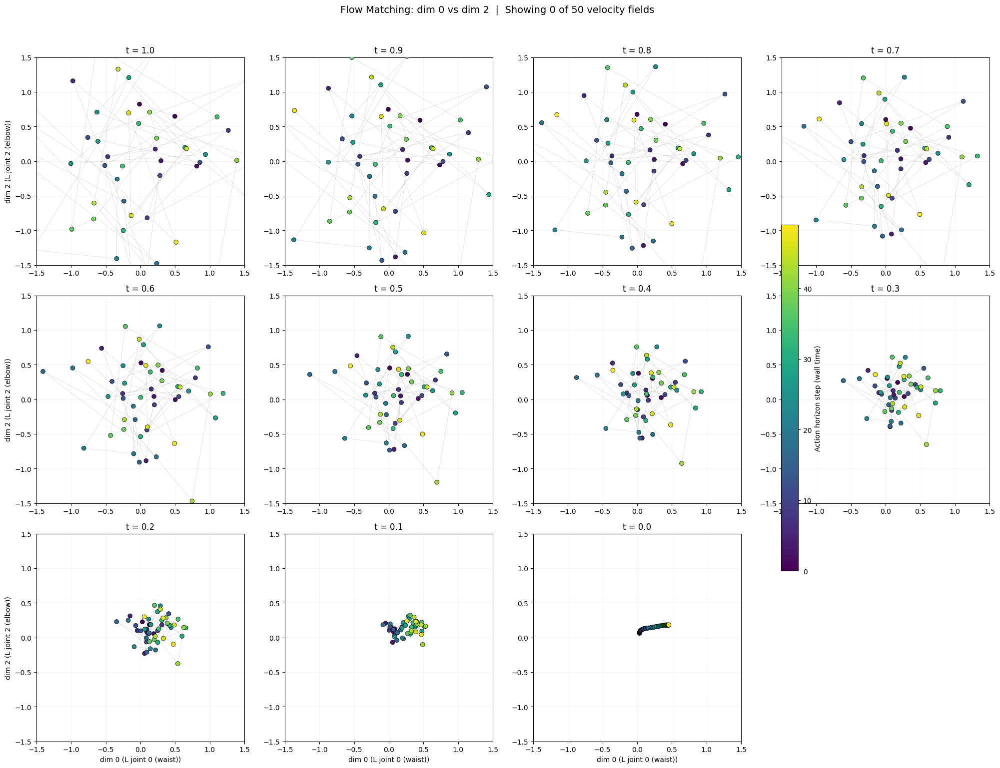

In [72]:
# No arrows — just the scatter (like your original plot)
plot_flow_with_fields(trajectory, velocity_fields, grid_x, grid_y,
                      action_steps_to_show=None)

/tmp/ipykernel_922436/1115852196.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


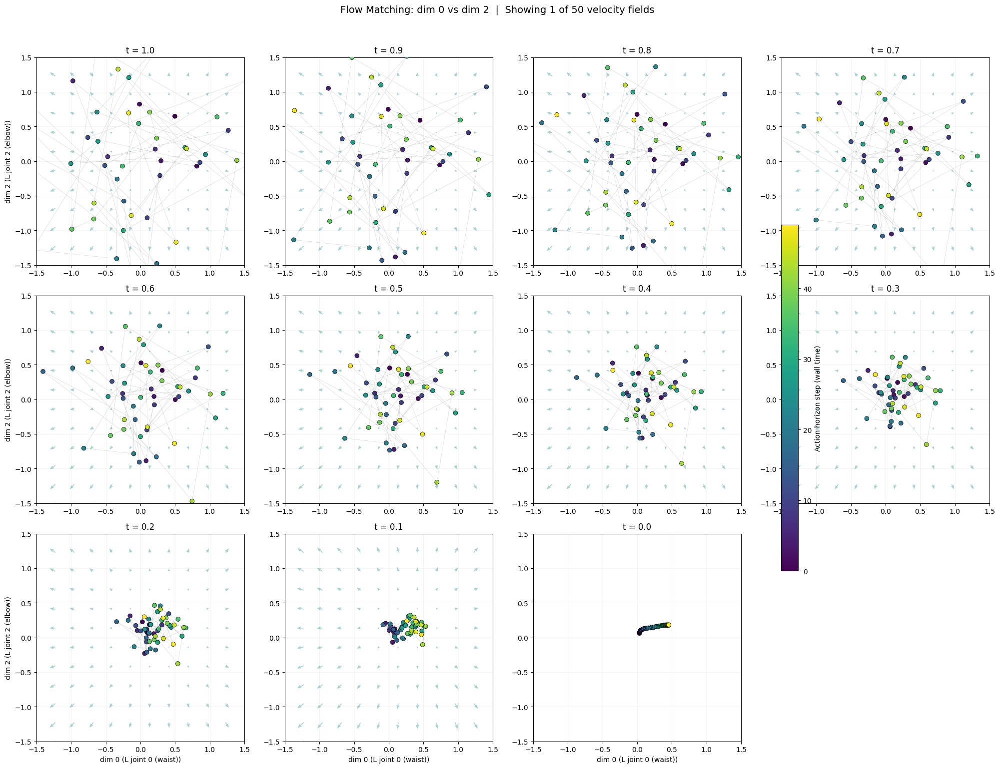

In [73]:
# Show velocity field for just 1 action step (e.g. step 25, mid-trajectory)
plot_flow_with_fields(trajectory, velocity_fields, grid_x, grid_y,
                      action_steps_to_show=[25])

/tmp/ipykernel_922436/1115852196.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


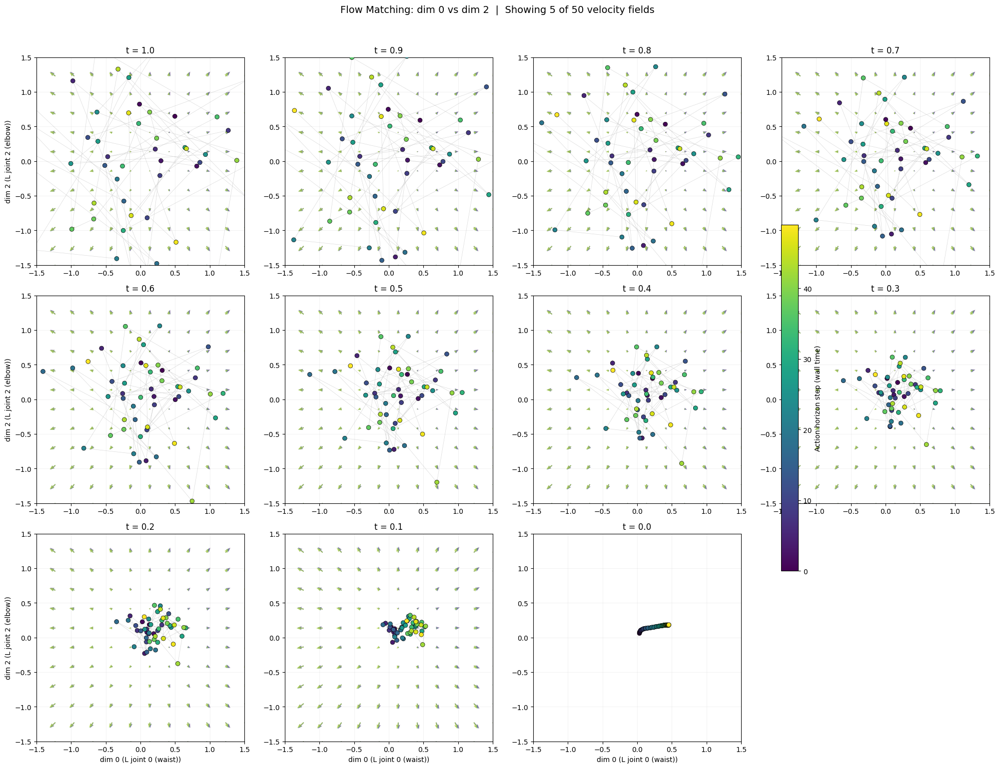

In [74]:
# Show 5 evenly spaced action steps
plot_flow_with_fields(trajectory, velocity_fields, grid_x, grid_y,
                      action_steps_to_show=[0, 12, 25, 37, 49])

/tmp/ipykernel_922436/1115852196.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


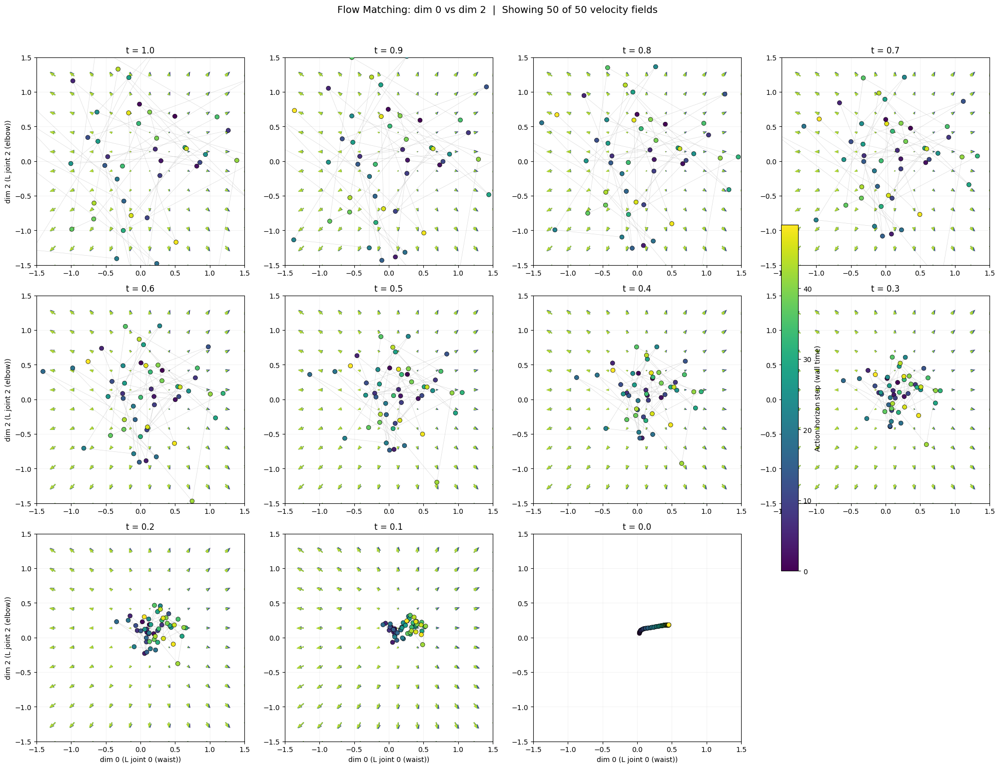

In [75]:
plot_flow_with_fields(trajectory, velocity_fields, grid_x, grid_y,
                      action_steps_to_show=list(range(50)),
                      arrow_alpha=0.15)

Hmmm not making a ton of sense, if we need to get this deep, might need to go to a toy 2d motion planning diffusion example. 

In [77]:
# === Compute velocity fields — focused on target region ===

from transformers.cache_utils import DynamicCache

DIM_X, DIM_Y = 0, 2
GRID_N = 20
GRID_RANGE = (0.0, 0.5)

xs = np.linspace(*GRID_RANGE, GRID_N)
ys = np.linspace(*GRID_RANGE, GRID_N)
grid_x, grid_y = np.meshgrid(xs, ys)
grid_flat_x = torch.tensor(grid_x.flatten(), dtype=torch.float32, device=device)
grid_flat_y = torch.tensor(grid_y.flatten(), dtype=torch.float32, device=device)
n_grid = GRID_N * GRID_N
ACTION_HORIZON = 50

def expand_kv_cache(kv_cache, batch_size):
    expanded = DynamicCache()
    for layer_idx in range(len(kv_cache)):
        k, v = kv_cache[layer_idx]
        expanded.update(
            k.expand(batch_size, -1, -1, -1),
            v.expand(batch_size, -1, -1, -1),
            layer_idx,
        )
    return expanded

# Evaluate at all 10 diff steps PLUS a near-zero step for t≈0
# t values: 1.0, 0.9, ..., 0.1, 0.05
diff_t_values = [1.0 - i * 0.1 for i in range(10)] + [0.05]
traj_indices  = list(range(10)) + [10]  # trajectory[10] is the t=0.0 snapshot

velocity_fields = {}

print(f"Grid: {GRID_N}x{GRID_N} = {n_grid} points")
print(f"Evaluating {len(diff_t_values)} timesteps x {n_grid} grid points = {len(diff_t_values) * n_grid} forward passes")
print()

t0 = time.time()

with torch.no_grad():
    for step_idx, (t_val, traj_idx) in enumerate(zip(diff_t_values, traj_indices)):
        base_x_t = torch.tensor(
            trajectory[traj_idx], dtype=torch.float32, device=device
        )  # [50, 32]

        step_fields = np.zeros((ACTION_HORIZON, GRID_N, GRID_N, 2))

        for gi in range(n_grid):
            batch_x_t = base_x_t[None].expand(ACTION_HORIZON, -1, -1).clone()
            batch_x_t[torch.arange(ACTION_HORIZON), torch.arange(ACTION_HORIZON), DIM_X] = grid_flat_x[gi]
            batch_x_t[torch.arange(ACTION_HORIZON), torch.arange(ACTION_HORIZON), DIM_Y] = grid_flat_y[gi]

            state_b = state.expand(ACTION_HORIZON, -1)
            prefix_pad_b = prefix_pad_masks.expand(ACTION_HORIZON, -1)
            cache_b = expand_kv_cache(kv_cache, ACTION_HORIZON)
            timestep_b = torch.full((ACTION_HORIZON,), t_val, dtype=torch.float32, device=device)

            v_out = pt_model.denoise_step(state_b, prefix_pad_b, cache_b, batch_x_t, timestep_b)

            row, col = gi // GRID_N, gi % GRID_N
            step_fields[:, row, col, 0] = v_out[torch.arange(ACTION_HORIZON), torch.arange(ACTION_HORIZON), DIM_X].cpu().numpy()
            step_fields[:, row, col, 1] = v_out[torch.arange(ACTION_HORIZON), torch.arange(ACTION_HORIZON), DIM_Y].cpu().numpy()

        velocity_fields[step_idx] = step_fields
        elapsed = time.time() - t0
        rate = (step_idx + 1) * n_grid / elapsed
        eta = (len(diff_t_values) - step_idx - 1) * n_grid / rate
        print(f"  step {step_idx} (t={t_val:.2f}): done  [{elapsed:.0f}s elapsed, ~{eta:.0f}s remaining]")

print(f"\nDone! Total time: {time.time() - t0:.0f}s")

Grid: 20x20 = 400 points
Evaluating 11 timesteps x 400 grid points = 4400 forward passes

  step 0 (t=1.00): done  [35s elapsed, ~349s remaining]
  step 1 (t=0.90): done  [70s elapsed, ~316s remaining]
  step 2 (t=0.80): done  [105s elapsed, ~281s remaining]
  step 3 (t=0.70): done  [141s elapsed, ~247s remaining]
  step 4 (t=0.60): done  [177s elapsed, ~212s remaining]
  step 5 (t=0.50): done  [212s elapsed, ~177s remaining]
  step 6 (t=0.40): done  [247s elapsed, ~141s remaining]
  step 7 (t=0.30): done  [283s elapsed, ~106s remaining]
  step 8 (t=0.20): done  [318s elapsed, ~71s remaining]
  step 9 (t=0.10): done  [354s elapsed, ~35s remaining]
  step 10 (t=0.05): done  [390s elapsed, ~0s remaining]

Done! Total time: 390s


In [93]:
def plot_flow_with_fields(trajectory, velocity_fields, grid_x, grid_y,
                          diff_t_values, action_steps_to_show=None,
                          arrow_alpha=0.4, arrow_scale=None):
    n_panels = len(trajectory)
    n_cols = 4
    n_rows = (n_panels + n_cols - 1) // n_cols

    cmap = plt.cm.viridis
    point_colors = cmap(np.linspace(0, 1, 50))
    targets = trajectory[-1]  # t=0 final positions

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))
    axes = axes.flatten()

    for plot_idx in range(n_panels):
        ax = axes[plot_idx]
        snap = trajectory[plot_idx]
        
        # Label: use actual t values for panels 0-9, and "t≈0" for the last
        if plot_idx < len(diff_t_values):
            t_label = f"t = {diff_t_values[plot_idx]:.2f}"
        else:
            t_label = "t = 0.0 (final)"

        # Velocity field arrows
        if action_steps_to_show and plot_idx in velocity_fields:
            vf = velocity_fields[plot_idx]
            for k in action_steps_to_show:
                color = point_colors[k]

                if arrow_scale is None:
                    grid_spacing = (GRID_RANGE[1] - GRID_RANGE[0]) / GRID_N
                    max_speed = np.sqrt(vf[k, :, :, 0]**2 + vf[k, :, :, 1]**2).max() + 1e-8
                    scale_factor = max_speed / grid_spacing * 1.0 #2.5
                else:
                    scale_factor = arrow_scale

                ax.quiver(grid_x, grid_y, vf[k, :, :, 0], vf[k, :, :, 1],
                          color=color, alpha=arrow_alpha, scale=scale_factor,
                          scale_units='xy', width=0.004, headwidth=4, zorder=2)

        # Target positions (open circles)
        ax.scatter(targets[:, DIM_X], targets[:, DIM_Y],
                   c=np.arange(50), cmap='viridis', s=50,
                   marker='o', facecolors='none', edgecolors=point_colors,
                   linewidths=1.5, zorder=4)

        # Connect targets with faint line to show trajectory shape
        ax.plot(targets[:, DIM_X], targets[:, DIM_Y],
                'k-', alpha=0.15, linewidth=0.5, zorder=3)

        # Current positions (filled dots)
        ax.scatter(snap[:, DIM_X], snap[:, DIM_Y],
                   c=np.arange(50), cmap='viridis', s=40,
                   zorder=5, edgecolors='k', linewidths=0.5)

        ax.set_title(t_label, fontsize=12)
        ax.set_xlim(*GRID_RANGE)
        ax.set_ylim(*GRID_RANGE)
        ax.set_aspect('equal')
        ax.grid(True, alpha=0.15)
        if plot_idx % n_cols == 0:
            ax.set_ylabel(f"dim {DIM_Y} ({joint_labels[DIM_Y]})")
        if plot_idx >= (n_rows - 1) * n_cols:
            ax.set_xlabel(f"dim {DIM_X} ({joint_labels[DIM_X]})")

    for i in range(n_panels, len(axes)):
        axes[i].set_visible(False)

    sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(0, 49))
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=axes[:n_panels], shrink=0.6, pad=0.02)
    cbar.set_label('Action horizon step')

    n_shown = len(action_steps_to_show) if action_steps_to_show else 0
    plt.suptitle(
        f"Flow Matching Velocity Fields — dim {DIM_X} vs dim {DIM_Y}\n"
        f"Filled dots = current x_t, hollow circles = targets (t=0)\n"
        f"Showing {n_shown} of 50 velocity fields",
        fontsize=13, y=1.02
    )
    plt.tight_layout()
    plt.show()

/tmp/ipykernel_922436/3752948484.py:43: UserWarning: You passed both c and facecolor/facecolors for the markers. c has precedence over facecolor/facecolors. This behavior may change in the future.
  ax.scatter(targets[:, DIM_X], targets[:, DIM_Y],
/tmp/ipykernel_922436/3752948484.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


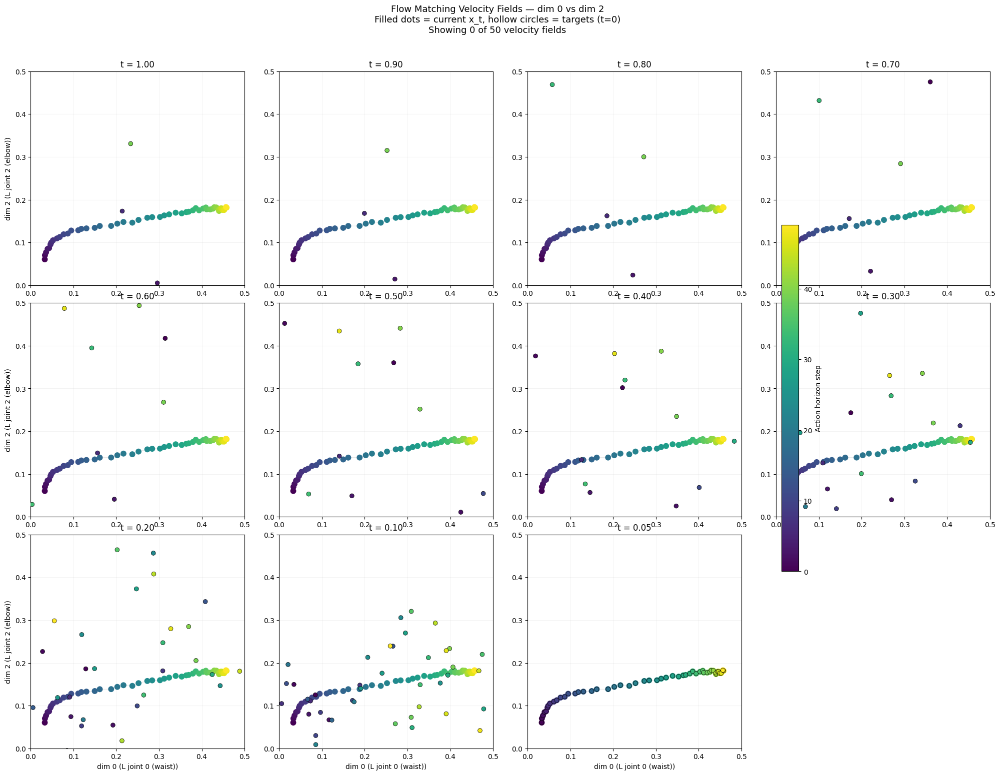

In [83]:
# Just the scatter — dots converging on targets
plot_flow_with_fields(trajectory, velocity_fields, grid_x, grid_y,
                      diff_t_values, action_steps_to_show=None, arrow_scale=3)

/tmp/ipykernel_922436/3143339920.py:43: UserWarning: You passed both c and facecolor/facecolors for the markers. c has precedence over facecolor/facecolors. This behavior may change in the future.
  ax.scatter(targets[:, DIM_X], targets[:, DIM_Y],
/tmp/ipykernel_922436/3143339920.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


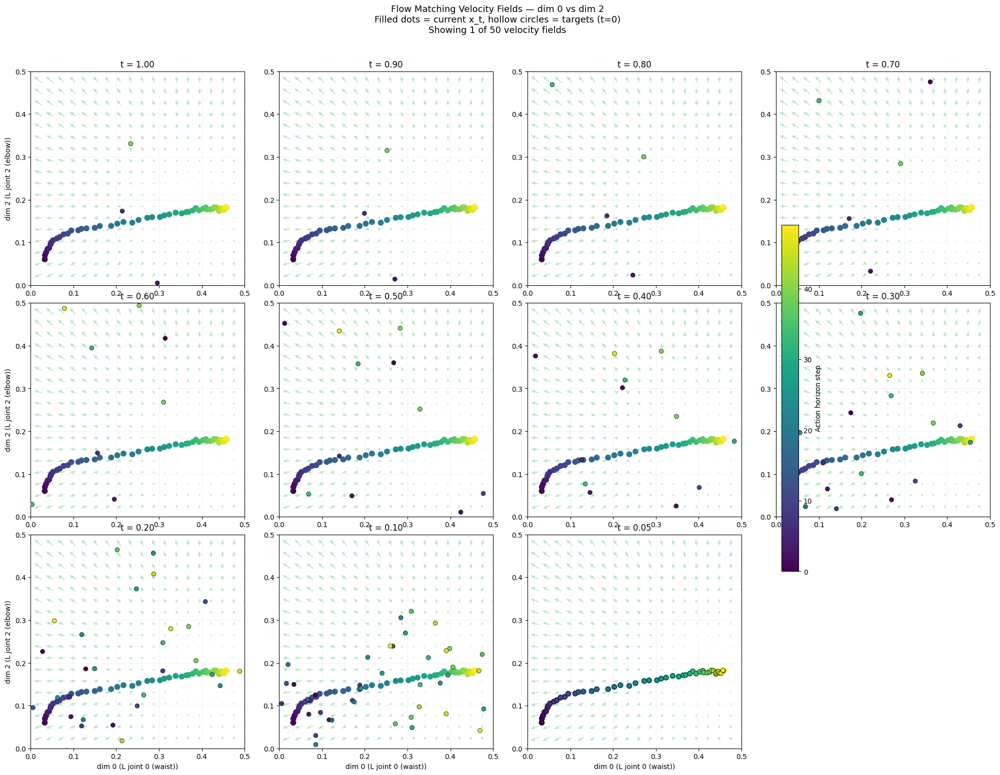

In [97]:
plot_flow_with_fields(trajectory, velocity_fields, grid_x, grid_y,
                      diff_t_values, action_steps_to_show=[35]) #,  arrow_scale=15)

/tmp/ipykernel_922436/3143339920.py:43: UserWarning: You passed both c and facecolor/facecolors for the markers. c has precedence over facecolor/facecolors. This behavior may change in the future.
  ax.scatter(targets[:, DIM_X], targets[:, DIM_Y],
/tmp/ipykernel_922436/3143339920.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


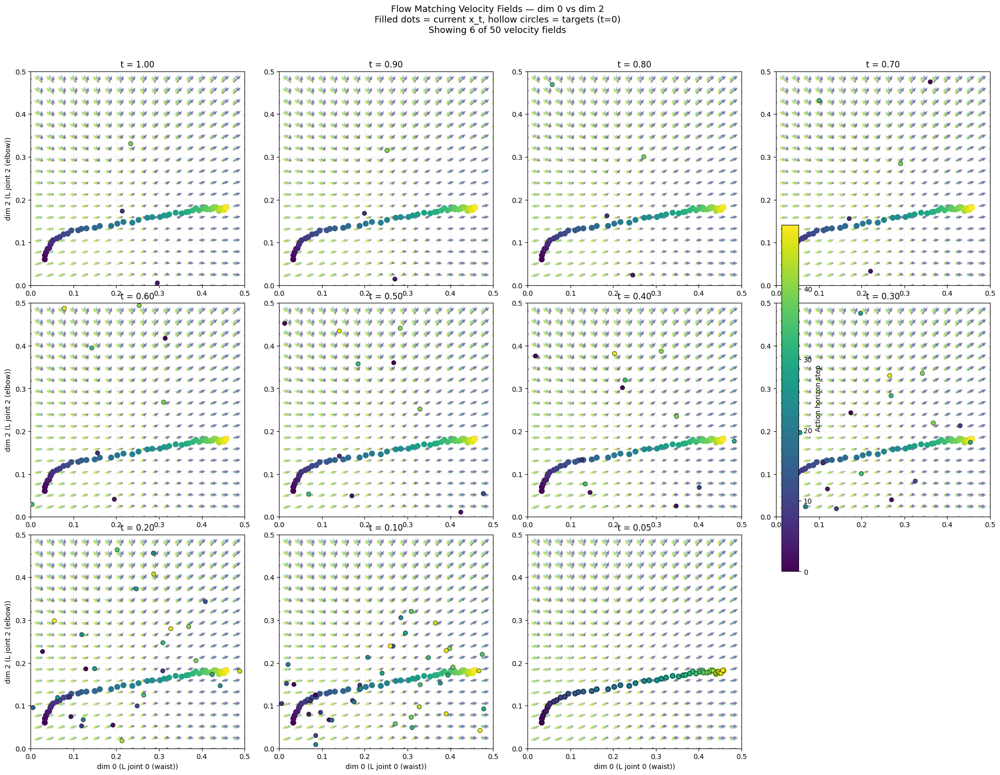

In [94]:
# A few action steps — each with its own attractor
plot_flow_with_fields(trajectory, velocity_fields, grid_x, grid_y,
                      diff_t_values, action_steps_to_show=[0, 10, 20, 30, 40, 49])

/tmp/ipykernel_922436/3143339920.py:43: UserWarning: You passed both c and facecolor/facecolors for the markers. c has precedence over facecolor/facecolors. This behavior may change in the future.
  ax.scatter(targets[:, DIM_X], targets[:, DIM_Y],
/tmp/ipykernel_922436/3143339920.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


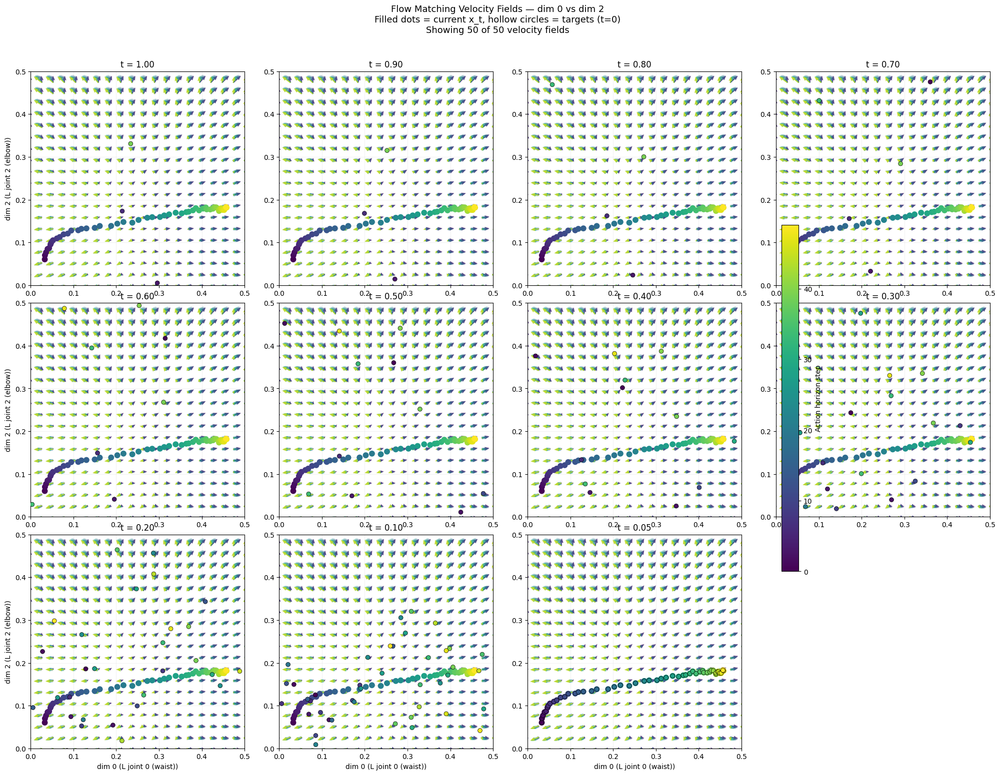

In [96]:
plot_flow_with_fields(trajectory, velocity_fields, grid_x, grid_y,
                      diff_t_values, action_steps_to_show=list(range(50)),
                      arrow_alpha=0.15)

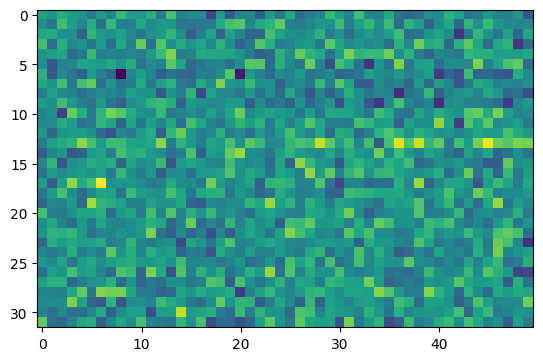

In [63]:
plt.imshow(velocities[-1].T)

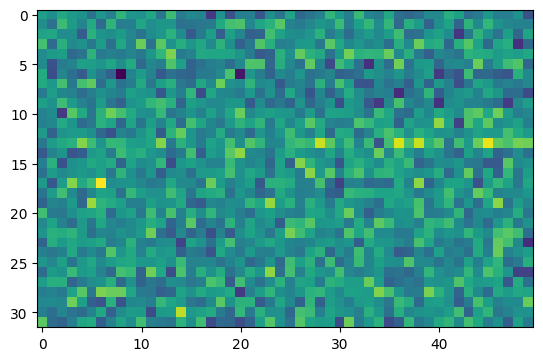

In [65]:
plt.imshow(velocities[0].T)

Ground truth actions: (50, 14)
Predicted actions: (50, 14)


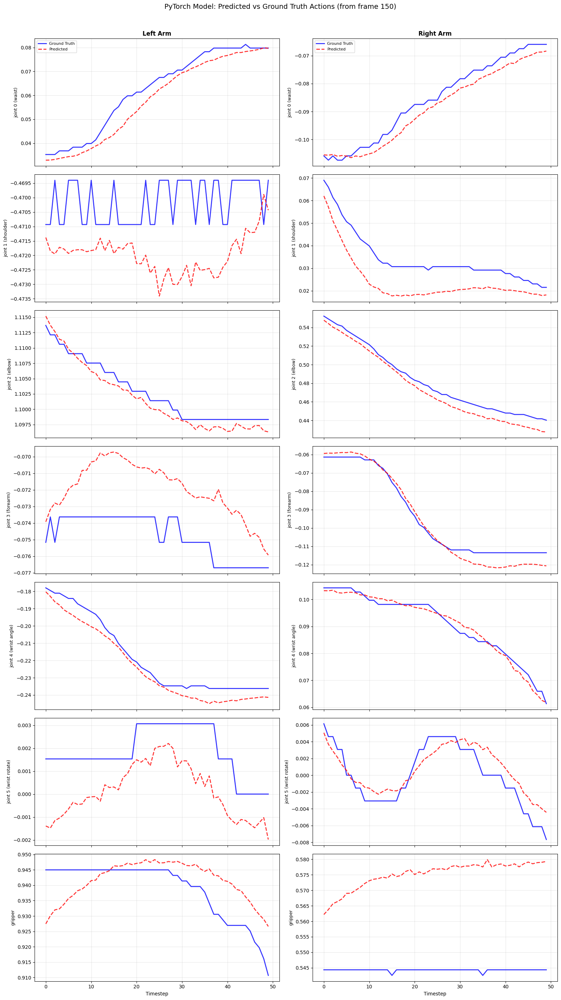

In [57]:
# Apply the same output transforms to our manually denoised actions
outputs_manual = {
    "state": np.asarray(inputs_pt["state"][0].cpu()),
    "actions": x_t[0].cpu().numpy(),
}
outputs_manual = policy._output_transform(outputs_manual)

predicted_actions = outputs_manual["actions"]

# Gather ground truth actions for the next action_horizon frames
action_horizon = predicted_actions.shape[0]
n_gt = min(action_horizon, len(episode) - FRAME_IDX)

gt_actions = np.array([episode[FRAME_IDX + t]["action"] for t in range(n_gt)])
print(f"Ground truth actions: {gt_actions.shape}")
print(f"Predicted actions: {predicted_actions.shape}")

# Plot predicted vs ground truth for each joint
fig, axes = plt.subplots(7, 2, figsize=(16, 28), sharex=True)
time_steps = np.arange(n_gt)

for arm_idx, arm_name in enumerate(["Left", "Right"]):
    offset = arm_idx * 7
    for joint_idx in range(7):
        ax = axes[joint_idx, arm_idx]
        dim = offset + joint_idx
        
        ax.plot(time_steps, gt_actions[:n_gt, dim], 'b-', linewidth=2, label='Ground Truth', alpha=0.8)
        ax.plot(time_steps, predicted_actions[:n_gt, dim], 'r--', linewidth=2, label='Predicted', alpha=0.8)
        
        ax.set_ylabel(joint_labels[dim].replace(f"{arm_name[0]} ", ""), fontsize=9)
        ax.grid(True, alpha=0.3)
        if joint_idx == 0:
            ax.set_title(f"{arm_name} Arm", fontsize=12, fontweight='bold')
            ax.legend(fontsize=8)
        if joint_idx == 6:
            ax.set_xlabel("Timestep")

plt.suptitle(f"PyTorch Model: Predicted vs Ground Truth Actions (from frame {FRAME_IDX})", fontsize=14, y=1.01)
plt.tight_layout()
plt.show()


---

In [45]:
num_steps = 10
dt = -1.0 / num_steps

# Start from fixed noise
noise_pt = torch.from_numpy(fixed_noise).to(device)[None, ...]  # [1, 50, 32]
x_t = noise_pt.clone()

# Collect trajectory for visualization
trajectory = [x_t[0].cpu().numpy().copy()]
velocities = []
t = 1.0


In [47]:
state

tensor([[-0.2073, -0.0050, -0.8066, -0.6117, -1.2639,  0.4968,  0.7046, -0.1185,
         -0.7430, -0.0498,  0.0678, -0.8378, -0.4027, -1.2744,  0.0000,  0.0000,
          0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000]],
       device='cuda:0', dtype=torch.float64)

In [48]:
# noise_pt.shape

In [49]:
# === Velocity field probing ===

ACTION_STEP = 0    # which of the 50 action steps to visualize
DIM_X = 0          # waist (horizontal axis)
DIM_Y = 2          # elbow (vertical axis)
GRID_N = 15        # 15x15 grid
BATCH_CHUNK = 25   # process this many grid points at a time to manage memory

def probe_velocity_field(t_val, base_x_t, grid_n=GRID_N):
    """Probe the velocity field at a grid of points for a given flow time.
    
    base_x_t: [1, 50, 32] — the trajectory's x_t at this timestep (used for all non-probed dims)
    Returns: grid_coords (grid_n, grid_n, 2), grid_velocities (grid_n, grid_n, 2)
    """
    # Determine grid range: center on the base point, extend ±3 sigma
    center_x = base_x_t[0, ACTION_STEP, DIM_X].item()
    center_y = base_x_t[0, ACTION_STEP, DIM_Y].item()
    
    # Use a range that covers both the noise distribution (std~1) and the trajectory
    span = max(3.0, abs(center_x) + 2.0, abs(center_y) + 2.0)
    xs = np.linspace(-span, span, grid_n)
    ys = np.linspace(-span, span, grid_n)
    grid_x, grid_y = np.meshgrid(xs, ys)
    
    # Build batch of x_t: each grid point modifies dims DIM_X and DIM_Y at ACTION_STEP
    n_points = grid_n * grid_n
    x_t_batch = base_x_t.expand(n_points, -1, -1).clone()  # [n_points, 50, 32]
    x_t_batch[:, ACTION_STEP, DIM_X] = torch.tensor(grid_x.flatten(), dtype=torch.float32, device=device)
    x_t_batch[:, ACTION_STEP, DIM_Y] = torch.tensor(grid_y.flatten(), dtype=torch.float32, device=device)
    
    # Expand state and prefix masks to match batch
    state_batch = state.expand(n_points, -1)
    prefix_pad_batch = prefix_pad_masks.expand(n_points, -1)
    
    # Expand KV cache — each layer's (K, V) from [1, ...] to [n_points, ...]
    # We'll do this per-chunk to save memory
    
    all_velocities = []
    
    for chunk_start in range(0, n_points, BATCH_CHUNK):
        chunk_end = min(chunk_start + BATCH_CHUNK, n_points)
        chunk_size = chunk_end - chunk_start
        
        x_t_chunk = x_t_batch[chunk_start:chunk_end]
        state_chunk = state_batch[chunk_start:chunk_end]
        prefix_pad_chunk = prefix_pad_batch[chunk_start:chunk_end]
        
        # Expand KV cache for this chunk
        from transformers.cache_utils import DynamicCache
        expanded_cache = DynamicCache()
        for layer_idx in range(len(kv_cache)):
            k, v = kv_cache[layer_idx]
            expanded_cache.update(
                k.expand(chunk_size, -1, -1, -1),
                v.expand(chunk_size, -1, -1, -1),
                layer_idx,
            )
        
        timestep_chunk = torch.tensor(t_val, dtype=torch.float32, device=device).expand(chunk_size)
        
        v_chunk = pt_model.denoise_step(
            state_chunk, prefix_pad_chunk, expanded_cache, x_t_chunk, timestep_chunk
        )
        
        # Extract velocity at our two dims for the target action step
        v_2d = v_chunk[:, ACTION_STEP, [DIM_X, DIM_Y]]  # [chunk_size, 2]
        all_velocities.append(v_2d.cpu().numpy())
    
    all_velocities = np.concatenate(all_velocities, axis=0)  # [n_points, 2]
    
    grid_vx = all_velocities[:, 0].reshape(grid_n, grid_n)
    grid_vy = all_velocities[:, 1].reshape(grid_n, grid_n)
    
    return grid_x, grid_y, grid_vx, grid_vy, xs, ys


# === Collect trajectory points for overlay ===
traj_x = [tr[ACTION_STEP, DIM_X] for tr in trajectory]  # dim 0 at each flow step
traj_y = [tr[ACTION_STEP, DIM_Y] for tr in trajectory]  # dim 2 at each flow step

In [50]:
# === Probe at multiple flow times ===
# Use the trajectory snapshots as the base x_t for each timestep

flow_times = [1.0, 0.5, 0.1]
fields = {}

with torch.no_grad():
    for t_val in flow_times:
        # Figure out which trajectory snapshot corresponds to this t
        # trajectory[0] is t=1.0, trajectory[1] is t=0.9, ..., trajectory[k] is t=1.0 - k*0.1
        traj_idx = int(round((1.0 - t_val) / 0.1))
        base_x_t = torch.tensor(trajectory[traj_idx], dtype=torch.float32, device=device)[None, ...]
        
        print(f"Probing t={t_val} (trajectory step {traj_idx})...")
        gx, gy, gvx, gvy, xs, ys = probe_velocity_field(t_val, base_x_t)
        fields[t_val] = (gx, gy, gvx, gvy, xs, ys)
        print(f"  Done. Velocity magnitude range: [{np.sqrt(gvx**2 + gvy**2).min():.2f}, {np.sqrt(gvx**2 + gvy**2).max():.2f}]")

Probing t=1.0 (trajectory step 0)...
  Done. Velocity magnitude range: [0.09, 4.35]


IndexError: list index out of range

In [ ]:
# === Plot velocity fields ===

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

for ax, t_val in zip(axes, flow_times):
    gx, gy, gvx, gvy, xs, ys = fields[t_val]
    
    # Velocity magnitude for coloring
    speed = np.sqrt(gvx**2 + gvy**2)
    
    # Quiver plot — normalize arrow lengths for readability
    ax.quiver(gx, gy, gvx, gvy, speed, 
              cmap='coolwarm', alpha=0.7, scale=speed.max() * 15)
    
    # Overlay trajectory (color by flow time: yellow=t=1 noise, dark=t=0 action)
    traj_idx = int(round((1.0 - t_val) / 0.1))
    colors = plt.cm.plasma(np.linspace(0, 1, len(traj_x)))
    
    # Plot full trajectory
    ax.plot(traj_x, traj_y, 'k-', linewidth=1, alpha=0.3)
    for i in range(len(traj_x)):
        ax.scatter(traj_x[i], traj_y[i], c=[colors[i]], s=30, zorder=5, edgecolors='k', linewidths=0.5)
    
    # Highlight current position
    ax.scatter(traj_x[traj_idx], traj_y[traj_idx], 
               c='lime', s=150, zorder=10, edgecolors='k', linewidths=2, marker='*',
               label=f'current x_t')
    
    # Mark start (noise) and end (action)
    ax.scatter(traj_x[0], traj_y[0], c='red', s=80, zorder=6, marker='s', edgecolors='k', label='t=1 (noise)')
    ax.scatter(traj_x[-1], traj_y[-1], c='blue', s=80, zorder=6, marker='o', edgecolors='k', label='t=0 (action)')
    
    ax.set_xlabel(f"dim {DIM_X} ({joint_labels[DIM_X]})")
    ax.set_ylabel(f"dim {DIM_Y} ({joint_labels[DIM_Y]})")
    ax.set_title(f"t = {t_val}")
    ax.legend(fontsize=7, loc='upper right')
    ax.set_aspect('equal')
    ax.grid(True, alpha=0.2)

plt.suptitle(f"Flow Matching Velocity Field — action step {ACTION_STEP} (normalized action space)", fontsize=14)
plt.tight_layout()
plt.show()

/tmp/ipykernel_922436/1044988964.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


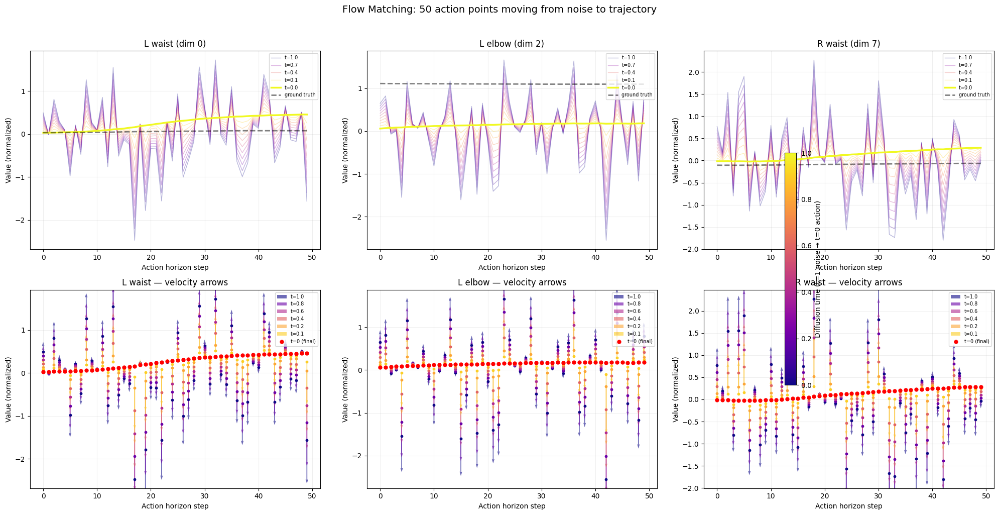

In [55]:
fig, axes = plt.subplots(2, 3, figsize=(20, 10))

# Pick a few dimensions to show
dims_to_show = [
    (0, "L waist"),
    (2, "L elbow"),
    (7, "R waist"),
]

wall_time = np.arange(50)  # action horizon axis (0-49)

for col, (dim, label) in enumerate(dims_to_show):
    # Top row: trajectories at each diffusion step
    ax = axes[0, col]
    n_snapshots = len(trajectory)  # 11: t=1.0, 0.9, ..., 0.0
    colors = plt.cm.plasma(np.linspace(0, 1, n_snapshots))
    
    for i, snap in enumerate(trajectory):
        t_val = 1.0 - i * 0.1
        alpha = 0.3 if i < n_snapshots - 1 else 1.0
        linewidth = 1.0 if i < n_snapshots - 1 else 2.5
        ax.plot(wall_time, snap[:, dim], color=colors[i], alpha=alpha, 
                linewidth=linewidth, label=f"t={t_val:.1f}" if i % 3 == 0 or i == n_snapshots - 1 else "")
    
    # Overlay ground truth
    if n_gt >= 50:
        ax.plot(wall_time, gt_actions[:50, dim], 'k--', linewidth=2, alpha=0.5, label='ground truth')
    
    ax.set_xlabel("Action horizon step")
    ax.set_ylabel(f"Value (normalized)")
    ax.set_title(f"{label} (dim {dim})")
    ax.legend(fontsize=7, loc='upper right')
    ax.grid(True, alpha=0.2)
    
    # Bottom row: velocity arrows showing how each point moves
    ax2 = axes[1, col]
    
    # Show a few diffusion timesteps with arrows
    for i, (snap, vel) in enumerate(zip(trajectory[:-1], velocities)):
        t_val = 1.0 - i * 0.1
        if i % 2 != 0 and i != len(velocities) - 1:
            continue  # skip some for clarity
        
        color = colors[i]
        # Plot current positions
        ax2.scatter(wall_time, snap[:, dim], c=[color], s=10, zorder=3)
        # Plot velocity arrows (scaled by dt for visual clarity)
        # Arrow goes from current position toward next position
        arrow_scale = 0.5  # visual scaling
        ax2.quiver(wall_time, snap[:, dim], 
                    np.zeros(50), vel[:, dim] * arrow_scale,
                    angles='xy', scale_units='xy', scale=1,
                    color=color, alpha=0.6, width=0.003,
                    label=f"t={t_val:.1f}")
    
    # Show final position
    ax2.scatter(wall_time, trajectory[-1][:, dim], c='red', s=25, zorder=5, label='t=0 (final)')
    
    ax2.set_xlabel("Action horizon step")
    ax2.set_ylabel(f"Value (normalized)")
    ax2.set_title(f"{label} — velocity arrows")
    ax2.legend(fontsize=7, loc='upper right')
    ax2.grid(True, alpha=0.2)

# Add a colorbar to show diffusion time
sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(0, 1))
sm.set_array([])
cbar = plt.colorbar(sm, ax=axes, shrink=0.6, pad=0.02)
cbar.set_label('Diffusion time (t=1 noise → t=0 action)')

plt.suptitle("Flow Matching: 50 action points moving from noise to trajectory", fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

In [53]:
num_steps = 10
dt = -1.0 / num_steps

# Start from fixed noise
noise_pt = torch.from_numpy(fixed_noise).to(device)[None, ...]  # [1, 50, 32]
x_t = noise_pt.clone()

# Collect trajectory for visualization
trajectory = [x_t[0].cpu().numpy().copy()]
velocities = []
t = 1.0

with torch.no_grad():
    for step in range(num_steps):
        timestep = torch.tensor([t], dtype=torch.float32, device=device)

        # === Embed suffix: state token + action/time tokens ===
        suffix_embs, suffix_pad_masks, suffix_att_masks, adarms_cond = pt_model.embed_suffix(
            state, x_t, timestep
        )
        if step == 0:
            print(f"suffix_embs: {suffix_embs.shape}")       # [1, 51, 1024] = 1 state + 50 action
            print(f"suffix_pad_masks: {suffix_pad_masks.shape}")
            print(f"suffix_att_masks: {suffix_att_masks.shape}")
            print(f"adarms_cond: {adarms_cond}")              # None for pi0

        # === Build attention mask ===
        # suffix queries attend to [prefix KV cache | suffix tokens]
        suffix_len = suffix_pad_masks.shape[1]
        batch_size = prefix_pad_masks.shape[0]
        prefix_len = prefix_pad_masks.shape[1]

        prefix_cross_mask = prefix_pad_masks[:, None, :].expand(batch_size, suffix_len, prefix_len)
        suffix_att_2d = make_att_2d_masks(suffix_pad_masks, suffix_att_masks)
        full_att_2d = torch.cat([prefix_cross_mask, suffix_att_2d], dim=2)

        if step == 0:
            print(f"full_att_2d: {full_att_2d.shape}")  # [1, 51, 816+51]

        # Suffix positions continue from where prefix left off
        prefix_offsets = torch.sum(prefix_pad_masks, dim=-1)[:, None]
        suffix_positions = prefix_offsets + torch.cumsum(suffix_pad_masks, dim=1) - 1

        # Convert to 4D mask
        full_att_4d = pt_model._prepare_attention_masks_4d(full_att_2d)

        # Set eager attention for action expert too
        pt_model.paligemma_with_expert.gemma_expert.model.config._attn_implementation = "eager"

        # === Forward pass: [None, suffix_embs] — action expert runs, PaliGemma skipped ===
        (prefix_out, suffix_out), _ = pt_model.paligemma_with_expert.forward(
            attention_mask=full_att_4d,
            position_ids=suffix_positions,
            past_key_values=kv_cache,
            inputs_embeds=[None, suffix_embs],
            use_cache=False,
            adarms_cond=[None, adarms_cond],
        )
        assert prefix_out is None

        # Extract velocity from last 50 tokens (action tokens, excluding state token)
        action_out = suffix_out[:, -pt_model.config.action_horizon:]
        v_t = pt_model.action_out_proj(action_out.to(torch.float32))

        if step == 0:
            print(f"\nv_t (velocity): {v_t.shape}")  # [1, 50, 32]

        # Euler step
        x_t = x_t + dt * v_t
        t = t + dt

        trajectory.append(x_t[0].cpu().numpy().copy())
        velocities.append(v_t[0].cpu().numpy().copy())
        print(f"  step {step}: t={t-dt:.1f}->{t:.1f}, |v_t|={v_t.norm():.2f}, |x_t|={x_t.norm():.2f}")

suffix_embs: torch.Size([1, 51, 1024])
suffix_pad_masks: torch.Size([1, 51])
suffix_att_masks: torch.Size([1, 51])
adarms_cond: None
full_att_2d: torch.Size([1, 51, 867])

v_t (velocity): torch.Size([1, 50, 32])
  step 0: t=1.0->0.9, |v_t|=41.55, |x_t|=35.79
  step 1: t=0.9->0.8, |v_t|=41.40, |x_t|=31.88
  step 2: t=0.8->0.7, |v_t|=41.42, |x_t|=28.03
  step 3: t=0.7->0.6, |v_t|=41.40, |x_t|=24.29
  step 4: t=0.6->0.5, |v_t|=41.37, |x_t|=20.69
  step 5: t=0.5->0.4, |v_t|=41.40, |x_t|=17.33
  step 6: t=0.4->0.3, |v_t|=41.35, |x_t|=14.39
  step 7: t=0.3->0.2, |v_t|=41.32, |x_t|=12.16
  step 8: t=0.2->0.1, |v_t|=41.22, |x_t|=11.09
  step 9: t=0.1->0.0, |v_t|=41.24, |x_t|=11.50


- Hmm space could be space and time could be a viridis color?
- That could be fun/cool!
- If choosing two axes is problematic, we should be able to map to cartesian coords, and then can vis position in 2d or 3d.
- Hmm wait do I need to like "probe the full space" to see the full velocity field?
- At least in the dimension I can about? I think so?
- Yeah so I think i would need to systematically step through the "state" field? Is that right? Trying to think through the dimensions here.
- 

In [33]:
trajectory[0].shape

(50, 32)

In [34]:
velocities[0].shape

(50, 32)

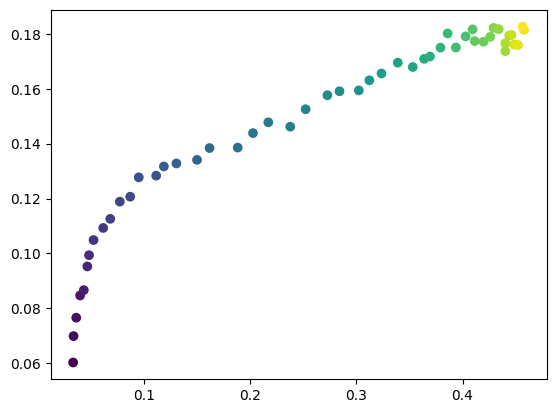

In [40]:
plt.scatter(trajectory[-1][:,0], trajectory[-1][:,2], c=np.arange(50), linestyle='-')

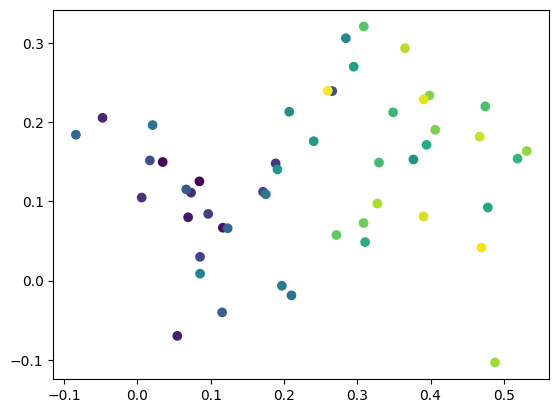

In [41]:
plt.scatter(trajectory[-2][:,0], trajectory[-2][:,2], c=np.arange(50), linestyle='-')

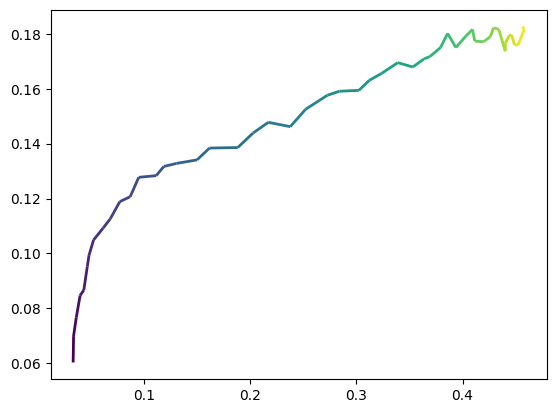

In [66]:
from matplotlib.collections import LineCollection

points = np.column_stack([trajectory[-1][:,0], trajectory[-1][:,2]])
segments = np.array([points[i:i+2] for i in range(len(points)-1)])

lc = LineCollection(segments, cmap='viridis', array=np.arange(len(segments)), linewidth=2)
plt.gca().add_collection(lc)
plt.autoscale()

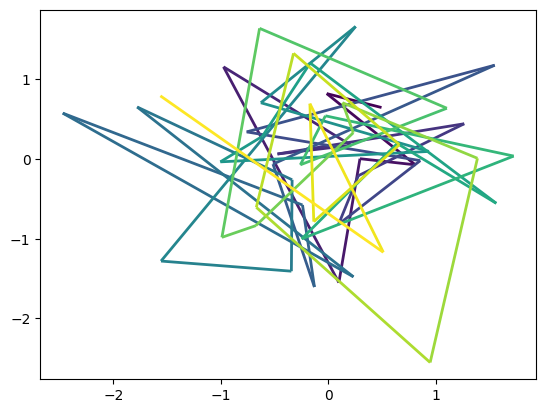

In [70]:
points = np.column_stack([trajectory[0][:,0], trajectory[0][:,2]])
segments = np.array([points[i:i+2] for i in range(len(points)-1)])

lc = LineCollection(segments, cmap='viridis', array=np.arange(len(segments)), linewidth=2)
plt.gca().add_collection(lc)
plt.autoscale()

- Woah is that right? What the fuck kind velocity field would fix this lol?
- Might make sense to first think about the velocity field for a single dimension, and have time as an axis
- I think this is the simplest/most canonical? And then from there consider we we can bring two dimensions together like this?

In [36]:
# policy._output_transform?

Ground truth actions: (50, 14)
Predicted actions: (50, 14)


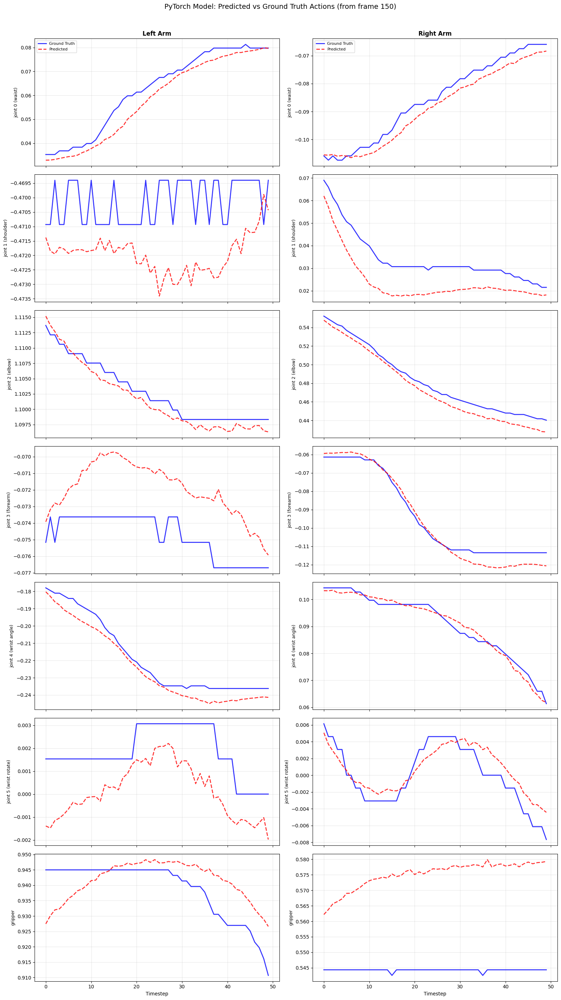

In [54]:
# Apply the same output transforms to our manually denoised actions
outputs_manual = {
    "state": np.asarray(inputs_pt["state"][0].cpu()),
    "actions": x_t[0].cpu().numpy(),
}
outputs_manual = policy._output_transform(outputs_manual)

predicted_actions = outputs_manual["actions"]

# Gather ground truth actions for the next action_horizon frames
action_horizon = predicted_actions.shape[0]
n_gt = min(action_horizon, len(episode) - FRAME_IDX)

gt_actions = np.array([episode[FRAME_IDX + t]["action"] for t in range(n_gt)])
print(f"Ground truth actions: {gt_actions.shape}")
print(f"Predicted actions: {predicted_actions.shape}")

# Plot predicted vs ground truth for each joint
fig, axes = plt.subplots(7, 2, figsize=(16, 28), sharex=True)
time_steps = np.arange(n_gt)

for arm_idx, arm_name in enumerate(["Left", "Right"]):
    offset = arm_idx * 7
    for joint_idx in range(7):
        ax = axes[joint_idx, arm_idx]
        dim = offset + joint_idx
        
        ax.plot(time_steps, gt_actions[:n_gt, dim], 'b-', linewidth=2, label='Ground Truth', alpha=0.8)
        ax.plot(time_steps, predicted_actions[:n_gt, dim], 'r--', linewidth=2, label='Predicted', alpha=0.8)
        
        ax.set_ylabel(joint_labels[dim].replace(f"{arm_name[0]} ", ""), fontsize=9)
        ax.grid(True, alpha=0.3)
        if joint_idx == 0:
            ax.set_title(f"{arm_name} Arm", fontsize=12, fontweight='bold')
            ax.legend(fontsize=8)
        if joint_idx == 6:
            ax.set_xlabel("Timestep")

plt.suptitle(f"PyTorch Model: Predicted vs Ground Truth Actions (from frame {FRAME_IDX})", fontsize=14, y=1.01)
plt.tight_layout()
plt.show()


- How exaclty are models used together?
- What do attention patterns look like?


```
        (prefix_out, suffix_out), _ = pt_model.paligemma_with_expert.forward(
            attention_mask=full_att_4d,
            position_ids=suffix_positions,
            past_key_values=kv_cache,
            inputs_embeds=[None, suffix_embs],
            use_cache=False,
            adarms_cond=[None, adarms_cond],
        )
```

Hmm I think I might need to sketch this out, and then Chat with Claude some more.

In [ ]:
816+51

In [37]:
full_att_4d.shape

torch.Size([1, 1, 51, 867])

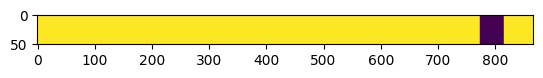

In [38]:
plt.imshow(full_att_4d[0,0].detach().cpu().numpy())

In [41]:
suffix_out.shape

torch.Size([1, 51, 1024])

In [40]:
action_out.shape

torch.Size([1, 50, 1024])

In [42]:
pt_model.action_out_proj

Linear(in_features=1024, out_features=32, bias=True)

In [46]:
np.where(np.abs(np.diff(full_att_4d[0,0,0,:].detach().cpu().numpy())))

(array([773, 815, 816]),)

## 8. Compare Against Reference

In [35]:
# Apply the same output transforms to our manually denoised actions
outputs_manual = {
    "state": np.asarray(inputs_pt["state"][0].cpu()),
    "actions": x_t[0].cpu().numpy(),
}
outputs_manual = policy._output_transform(outputs_manual)

max_diff = np.max(np.abs(result_ref["actions"] - outputs_manual["actions"]))
print(f"Max diff vs reference: {max_diff:.2e}")
print(f"All close (atol=1e-4): {np.allclose(result_ref['actions'], outputs_manual['actions'], atol=1e-4)}")
print(f"All close (atol=1e-3): {np.allclose(result_ref['actions'], outputs_manual['actions'], atol=1e-3)}")

Max diff vs reference: 8.73e-04
All close (atol=1e-4): False
All close (atol=1e-3): True


## 9. Compare: Using denoise_step (cleaner API)

The PyTorch model has a nice self-contained `denoise_step` method.
Let's verify it matches our manual loop, then use it going forward.

In [36]:
# Re-run using the model's denoise_step method
x_t_v2 = noise_pt.clone()
t_v2 = 1.0

with torch.no_grad():
    for step in range(num_steps):
        timestep = torch.tensor(t_v2, dtype=torch.float32, device=device).expand(1)
        v_t = pt_model.denoise_step(
            state, prefix_pad_masks, kv_cache, x_t_v2, timestep
        )
        x_t_v2 = x_t_v2 + dt * v_t
        t_v2 += dt

diff_v2 = (x_t_v2 - x_t).abs().max().item()
print(f"Max diff (manual loop vs denoise_step): {diff_v2:.2e}")

Max diff (manual loop vs denoise_step): 0.00e+00


## 10. Plot Predicted vs Ground Truth Actions

In [37]:
predicted_actions = outputs_manual["actions"]

In [38]:
# Gather ground truth actions for the next action_horizon frames
action_horizon = predicted_actions.shape[0]
n_gt = min(action_horizon, len(episode) - FRAME_IDX)

gt_actions = np.array([episode[FRAME_IDX + t]["action"] for t in range(n_gt)])
print(f"Ground truth actions: {gt_actions.shape}")
print(f"Predicted actions: {predicted_actions.shape}")

Ground truth actions: (50, 14)
Predicted actions: (50, 14)


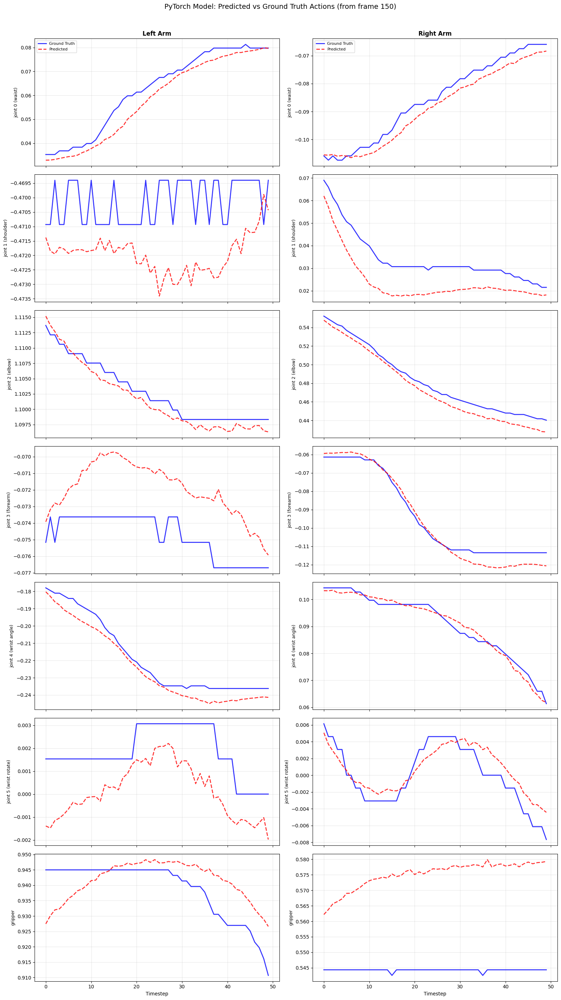

In [39]:
# Plot predicted vs ground truth for each joint
fig, axes = plt.subplots(7, 2, figsize=(16, 28), sharex=True)
time_steps = np.arange(n_gt)

for arm_idx, arm_name in enumerate(["Left", "Right"]):
    offset = arm_idx * 7
    for joint_idx in range(7):
        ax = axes[joint_idx, arm_idx]
        dim = offset + joint_idx
        
        ax.plot(time_steps, gt_actions[:n_gt, dim], 'b-', linewidth=2, label='Ground Truth', alpha=0.8)
        ax.plot(time_steps, predicted_actions[:n_gt, dim], 'r--', linewidth=2, label='Predicted', alpha=0.8)
        
        ax.set_ylabel(joint_labels[dim].replace(f"{arm_name[0]} ", ""), fontsize=9)
        ax.grid(True, alpha=0.3)
        if joint_idx == 0:
            ax.set_title(f"{arm_name} Arm", fontsize=12, fontweight='bold')
            ax.legend(fontsize=8)
        if joint_idx == 6:
            ax.set_xlabel("Timestep")

plt.suptitle(f"PyTorch Model: Predicted vs Ground Truth Actions (from frame {FRAME_IDX})", fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

## 11. Bonus: Hook Into Individual Layers

This is the main payoff of switching to PyTorch — we can register forward hooks
on any layer and capture activations as they flow through the transformer.

In [26]:
# Register hooks on every layer of both experts
activations = {}
hooks = []

def make_hook(name):
    def hook_fn(module, inp, out):
        # Store detached copies to avoid memory issues
        if isinstance(out, torch.Tensor):
            activations[name] = out.detach().cpu()
        elif isinstance(out, tuple) and len(out) > 0:
            activations[name] = out[0].detach().cpu() if isinstance(out[0], torch.Tensor) else str(type(out[0]))
    return hook_fn

# Hook PaliGemma layers (prefix expert)
pali_layers = pt_model.paligemma_with_expert.paligemma.language_model.layers
for i, layer in enumerate(pali_layers):
    h = layer.register_forward_hook(make_hook(f"pali_layer_{i}"))
    hooks.append(h)

# Hook action expert layers
expert_layers = pt_model.paligemma_with_expert.gemma_expert.model.layers
for i, layer in enumerate(expert_layers):
    h = layer.register_forward_hook(make_hook(f"expert_layer_{i}"))
    hooks.append(h)

print(f"Registered {len(hooks)} hooks")
print(f"  PaliGemma layers: {len(pali_layers)}")
print(f"  Action expert layers: {len(expert_layers)}")

Registered 36 hooks
  PaliGemma layers: 18
  Action expert layers: 18


In [27]:
# Run one denoising step and capture activations
activations.clear()

with torch.no_grad():
    timestep = torch.tensor([1.0], dtype=torch.float32, device=device)
    v_t_hooked = pt_model.denoise_step(
        state, prefix_pad_masks, kv_cache, noise_pt, timestep
    )

print("Captured activations:")
for name, act in sorted(activations.items()):
    if isinstance(act, torch.Tensor):
        print(f"  {name}: {act.shape}, dtype={act.dtype}")
    else:
        print(f"  {name}: {act}")

Captured activations:
  expert_layer_0: torch.Size([1, 51, 1024]), dtype=torch.bfloat16
  expert_layer_1: torch.Size([1, 51, 1024]), dtype=torch.bfloat16
  expert_layer_10: torch.Size([1, 51, 1024]), dtype=torch.bfloat16
  expert_layer_11: torch.Size([1, 51, 1024]), dtype=torch.bfloat16
  expert_layer_12: torch.Size([1, 51, 1024]), dtype=torch.bfloat16
  expert_layer_13: torch.Size([1, 51, 1024]), dtype=torch.bfloat16
  expert_layer_14: torch.Size([1, 51, 1024]), dtype=torch.bfloat16
  expert_layer_15: torch.Size([1, 51, 1024]), dtype=torch.bfloat16
  expert_layer_16: torch.Size([1, 51, 1024]), dtype=torch.bfloat16
  expert_layer_17: torch.Size([1, 51, 1024]), dtype=torch.bfloat16
  expert_layer_2: torch.Size([1, 51, 1024]), dtype=torch.bfloat16
  expert_layer_3: torch.Size([1, 51, 1024]), dtype=torch.bfloat16
  expert_layer_4: torch.Size([1, 51, 1024]), dtype=torch.bfloat16
  expert_layer_5: torch.Size([1, 51, 1024]), dtype=torch.bfloat16
  expert_layer_6: torch.Size([1, 51, 1024]), d

In [28]:
# Clean up hooks when done
for h in hooks:
    h.remove()
hooks.clear()
print("Hooks removed")

Hooks removed
